In [29]:
import pandas as pd
import seaborn as sns

from scipy.ndimage import binary_closing
from skimage.morphology import remove_small_objects

from sklearn.metrics import roc_curve, auc
import warnings
warnings.filterwarnings('ignore')

### KMM algorithm first approach

In [55]:
def kmm_thinning(bin_img):
   h, w = bin_img.shape
   label = bin_img.copy().astype(np.uint8)

   to_mark = []
   for i in range(1, h-1):
       for j in range(1, w-1):
           if label[i,j] == 1:
               if (label[i-1,j] == 0 or label[i+1,j] == 0 or
                   label[i,j-1] == 0 or label[i,j+1] == 0):
                   to_mark.append((i,j))
   for i,j in to_mark: label[i,j] = 2

   to_mark = []
   for i in range(1, h-1):
       for j in range(1, w-1):
           if label[i,j] == 1:
               if (label[i-1,j-1] == 0 or label[i-1,j+1] == 0 or
                   label[i+1,j-1] == 0 or label[i+1,j+1] == 0):
                   to_mark.append((i,j))
   for i,j in to_mark: label[i,j] = 3

   to_remove = []
   for i in range(1, h-1):
       for j in range(1, w-1):
           if label[i,j] in (2,3):
               neigh = [
                   label[i-1,j], label[i-1,j+1], label[i,j+1], label[i+1,j+1],
                   label[i+1,j], label[i+1,j-1], label[i,j-1], label[i-1,j-1]
               ]
               cnt = sum(1 for v in neigh if v >= 2)
               if 2 <= cnt <= 4:
                   to_remove.append((i,j))
   for i,j in to_remove: label[i,j] = 4
   label[label==4] = 0

   removal_table = {
       3,5,7,12,13,14,15,20,21,22,23,28,29,30,31,
       52,53,54,55,60,61,62,63,81,82,83,84,85,86,87,88,89,
       91,92,93,94,95,96,97,101,102,103,104,105,106,107,108,114,
       115,116,117,118,119,120,121,122,123,124,125,126,127,
       157,159,181,183,189,191,195,197,199,205,207,
       209,211,212,213,214,215,216,217,218,219,220,221,222,223,
       237,239,247,248,249,251,252,253,254,255
   }

   changed = True
   while changed:
       changed = False
       for N in (2, 3):
           to_del = []
           for i in range(1, h-1):
               for j in range(1, w-1):
                   if label[i,j] == N:
                       neighbors = [
                           (i-1,j-1,128),(i-1,j,1),(i-1,j+1,2),
                           (i,j+1,4),
                           (i+1,j+1,8),(i+1,j,16),(i+1,j-1,32),
                           (i,j-1,64)
                       ]
                       W = 0
                       for ni,nj,wg in neighbors:
                           if label[ni,nj] >= 2:
                               W += wg
                       if W in removal_table:
                           to_del.append((i,j))
                       else:
                           label[i,j] = 1
           if to_del:
               changed = True
               for i,j in to_del:
                   label[i,j] = 0

   return label

In [56]:
def display_series(hand, finger, data_dir, count=5):
   fig, axes = plt.subplots(count, 3, figsize=(12, 3 * count))
   for idx in range(1, count + 1):
       fname = f"{hand}-{finger}-{idx}.bmp"
       fpath = os.path.join(data_dir, fname)
       row = idx - 1

       if not os.path.isfile(fpath):
           for col in range(3):
               axes[row, col].axis('off')
           axes[row, 1].text(0.5, 0.5, f"Brak pliku:\n{fname}",
                             ha='center', va='center')
           continue

       img = Image.open(fpath)
       orig = np.array(img)
       gray = np.array(img.convert('L'))
       bin_img = (gray < 128).astype(np.uint8)
       skel = kmm_thinning(bin_img)
       skel_rgb = np.stack([skel*255]*3, axis=-1)

       axes[row, 0].imshow(orig)
       axes[row, 0].set_title(f"{fname}\noryginał")
       axes[row, 0].axis('off')

       axes[row, 1].imshow(gray, cmap='gray')
       axes[row, 1].set_title("grayscale")
       axes[row, 1].axis('off')

       axes[row, 2].imshow(skel_rgb)
       axes[row, 2].set_title("ścienianie KMM")
       axes[row, 2].axis('off')

   plt.tight_layout()
   plt.show()

In [57]:
def main(path):

    img = Image.open(path)
    orig = np.array(img)
    gray = np.array(img.convert('L'))

    bin_img = (gray < 128).astype(np.uint8)

    skel = kmm_thinning(bin_img)

    gray_rgb = np.stack([gray]*3, axis=-1)
    skel_rgb = np.stack([skel*255]*3, axis=-1)

    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(orig);       ax[0].set_title("Oryginał");    ax[0].axis('off')
    ax[1].imshow(gray_rgb);   ax[1].set_title("Grayscale");   ax[1].axis('off')
    ax[2].imshow(skel_rgb);   ax[2].set_title("Po ścienianiu");ax[2].axis('off')
    plt.tight_layout()
    plt.show()

### First call

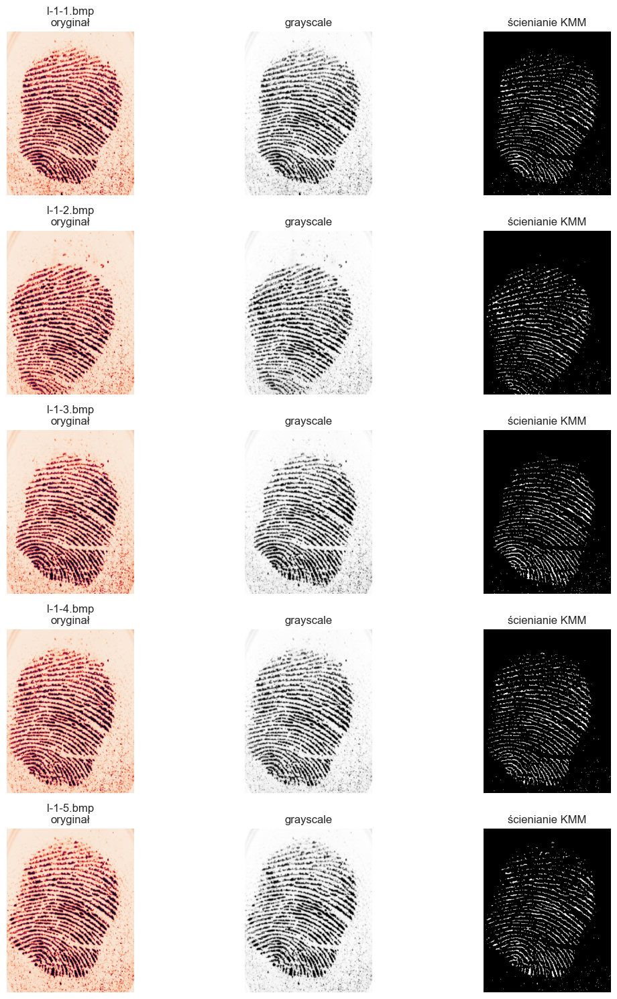

In [58]:
data_dir = 'data/Demo'

display_series('l', '1', data_dir, count=5)

getting rid of residual noise around the fingerprint

In [38]:
def process_and_display(hand, finger, data_dir, count=5):

    prefix = hand.upper()
    fig, axes = plt.subplots(count, 3, figsize=(12, 3*count))

    for idx in range(1, count+1):
        fname = f"{prefix}-{finger}-{idx}.bmp"
        fpath = os.path.join(data_dir, fname)
        row = idx - 1

        if not os.path.isfile(fpath):
            for col in range(3):
                axes[row, col].axis('off')
            axes[row,1].text(0.5, 0.5, f"Brak pliku:\n{fname}",
                              ha='center', va='center')
            continue

        img = Image.open(fpath)
        orig = np.array(img)

        gray = np.array(img.convert('L'))
        gray = median_filter(gray, size=3)
        gray_rgb = np.stack([gray]*3, axis=-1)

        bin_img = (gray < 128).astype(np.uint8)
        bin_img = binary_opening(bin_img, structure=np.ones((3,3))).astype(np.uint8)

        skel = kmm_thinning(bin_img)
        skel_rgb = np.stack([skel*255]*3, axis=-1)

        axes[row,0].imshow(orig)
        axes[row,0].set_title(f"{fname}\nOryginał")
        axes[row,0].axis('off')

        axes[row,1].imshow(gray_rgb)
        axes[row,1].set_title("Grayscale + median")
        axes[row,1].axis('off')

        axes[row,2].imshow(skel_rgb)
        axes[row,2].set_title("Binar + opening + KMM")
        axes[row,2].axis('off')

    plt.tight_layout()
    plt.show()

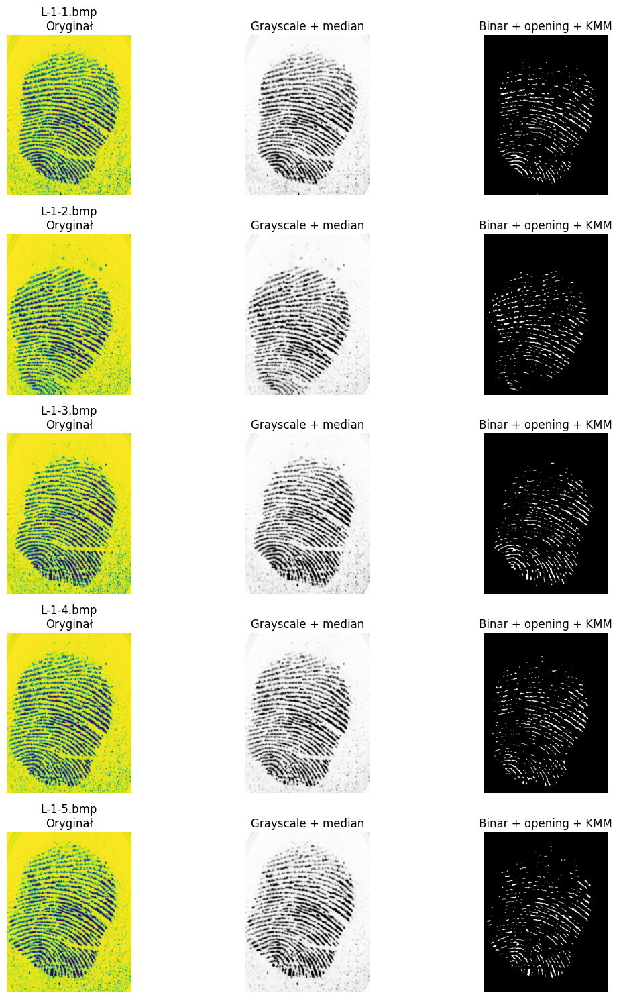

In [39]:
process_and_display('l', '1', data_dir, count=5)

In [42]:
def process_and_display_2(hand, finger, data_dir, count=5):

    prefix = hand.upper()
    fig, axes = plt.subplots(count, 3, figsize=(12, 3*count))

    for idx in range(1, count+1):
        fname = f"{prefix}-{finger}-{idx}.bmp"
        path = os.path.join(data_dir, fname)
        row = idx - 1

        if not os.path.isfile(path):
            for col in range(3):
                axes[row, col].axis('off')
            axes[row,1].text(0.5,0.5,f"Brak pliku:\n{fname}",
                              ha='center', va='center')
            continue

        img = Image.open(path)
        orig = np.array(img)

        gray = np.array(img.convert('L'))
        gray = median_filter(gray, size=3)
        gray_rgb = np.stack([gray]*3, axis=-1)

        bin_img = (gray < 128)

        bin_img = binary_closing(bin_img, structure=np.ones((5,5)))

        bin_img = remove_small_objects(bin_img, min_size=200)

        bin_img = binary_opening(bin_img, structure=np.ones((3,3))).astype(np.uint8)

        skel = kmm_thinning(bin_img)
        skel_rgb = np.stack([skel*255]*3, axis=-1)

        axes[row,0].imshow(orig)
        axes[row,0].set_title("Oryginał")
        axes[row,0].axis('off')
        axes[row,1].imshow(gray_rgb)
        axes[row,1].set_title("Grayscale + median")
        axes[row,1].axis('off')
        axes[row,2].imshow(skel_rgb)
        axes[row,2].set_title("Closing+RemoveSmall+Opening+KMM")
        axes[row,2].axis('off')

    plt.tight_layout()
    plt.show()

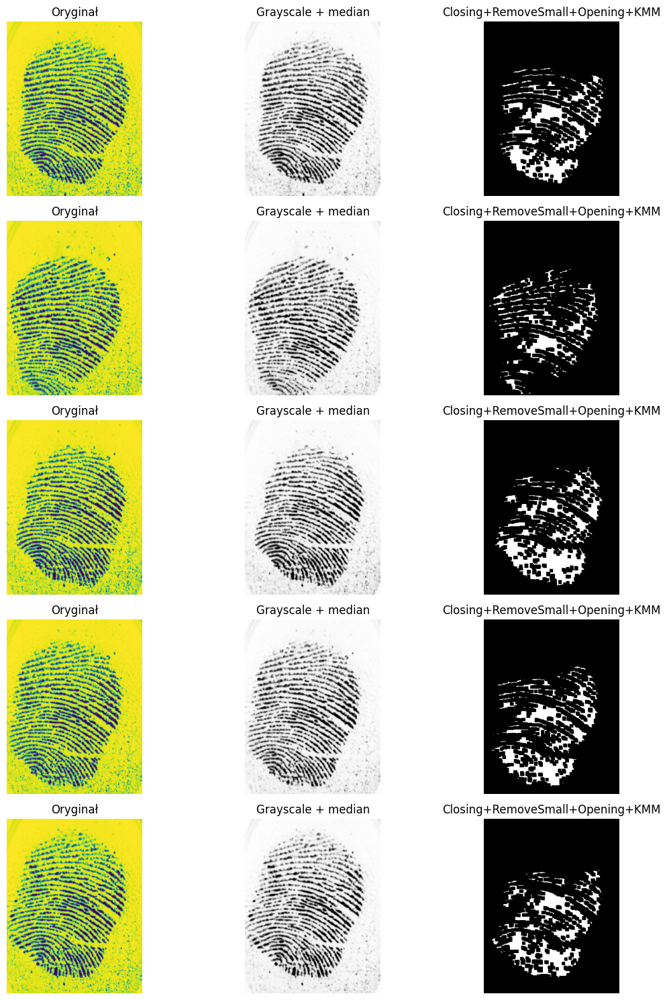

In [43]:
process_and_display_2('l', '1', data_dir, count=5)

In [39]:
def process_and_display_3(hand, finger, data_dir, count=5):

    prefix = hand.upper()
    fig, axes = plt.subplots(count, 3, figsize=(12, 3*count))

    for idx in range(1, count+1):
        fname = f"{prefix}-{finger}-{idx}.bmp"
        path = os.path.join(data_dir, fname)
        row = idx - 1

        if not os.path.isfile(path):
            for col in range(3):
                axes[row, col].axis('off')
            axes[row,1].text(0.5, 0.5, f"Brak pliku:\n{fname}",
                             ha='center', va='center')
            continue

        img = Image.open(path)
        orig = np.array(img)

        gray = np.array(img.convert('L'))
        gray = median_filter(gray, size=3)
        gray_rgb = np.stack([gray]*3, axis=-1)

        bin_img = (gray < 128).astype(np.uint8)

        bin_img = binary_opening(bin_img, structure=np.ones((2,2))).astype(np.uint8)

        skel = kmm_thinning(bin_img)
        skel_rgb = np.stack([skel*255]*3, axis=-1)

        axes[row, 0].imshow(orig)
        axes[row, 0].set_title("Oryginał")
        axes[row, 0].axis('off')

        axes[row, 1].imshow(gray_rgb)
        axes[row, 1].set_title("Grayscale + median")
        axes[row, 1].axis('off')

        axes[row, 2].imshow(skel_rgb)
        axes[row, 2].set_title("Binar + opening + KMM")
        axes[row, 2].axis('off')

    plt.tight_layout()
    plt.show()

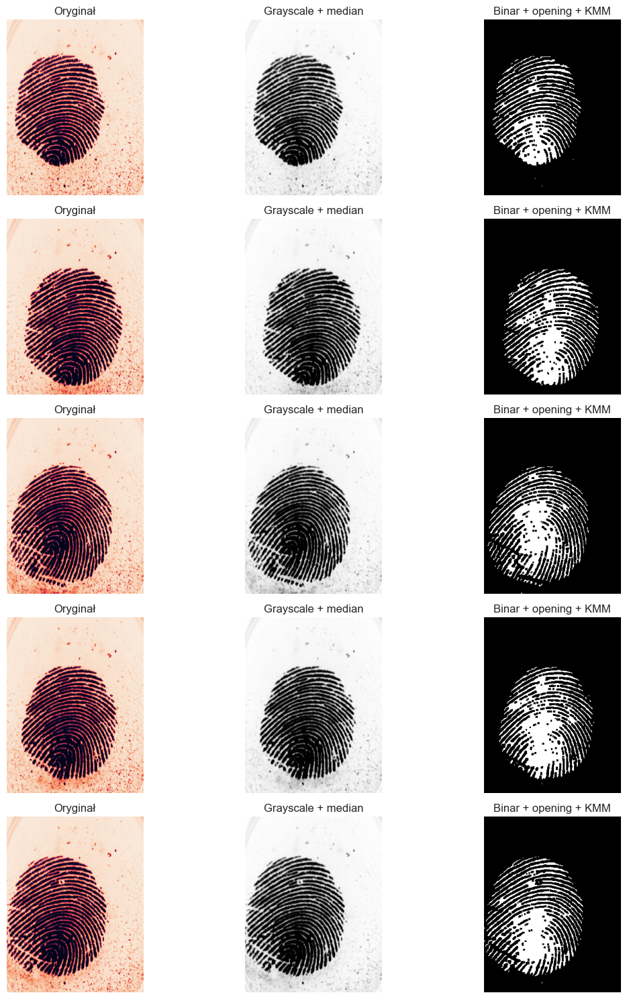

In [41]:
process_and_display_3('l', '3', data_dir, count=5)

### Deciding to implement version K3M

In [71]:
def k3m_thinning(bin_img):
   h, w = bin_img.shape
   img = bin_img.copy()

   A0 = {3, 6, 7, 12, 14, 15, 24, 28, 30, 31, 48, 56, 60, 62, 63, 96, 112, 120, 124, 126, 127,
         129, 131, 135, 143, 159, 191, 192, 193, 195, 199, 207, 223, 224, 225, 227, 231, 239,
         240, 241, 243, 247, 248, 249, 251, 252, 253, 254}

   A1 = {7, 14, 28, 56, 112, 131, 193, 224}

   A2 = {7, 14, 15, 28, 30, 56, 60, 112, 120, 131, 135, 193, 195, 224, 225, 240}

   A3 = {7, 14, 15, 28, 30, 31, 56, 60, 62, 112, 120, 124, 131, 135, 143, 193, 195, 199, 224,
         225, 227, 240, 241, 248}

   A4 = {7, 14, 15, 28, 30, 31, 56, 60, 62, 63, 112, 120, 124, 126, 131, 135, 143, 159, 193,
         195, 199, 207, 224, 225, 227, 231, 240, 241, 243, 248, 249, 252}

   A5 = {7, 14, 15, 28, 30, 31, 56, 60, 62, 63, 112, 120, 124, 126, 131, 135, 143, 159, 191,
         193, 195, 199, 207, 224, 225, 227, 231, 239, 240, 241, 243, 248, 249, 251, 252, 254}

   A1pix = {3, 6, 7, 12, 14, 15, 24, 28, 30, 31, 48, 56, 60, 62, 63, 96, 112, 120, 124, 126,
           127, 129, 131, 135, 143, 159, 191, 192, 193, 195, 199, 207, 223, 224, 225, 227,
           231, 239, 240, 241, 243, 247, 248, 249, 251, 252, 253, 254}

   N = np.array([
       [128, 1, 2],
       [64, 0, 4],
       [32, 16, 8]
   ])

   def calculate_weight(x, y):
       weight = 0
       for i in range(-1, 2):
           for j in range(-1, 2):
               if 0 <= x+i < h and 0 <= y+j < w:
                   if i == 0 and j == 0:
                       continue
                   if img[x+i, y+j] > 0:
                       weight += N[i+1, j+1]
       return weight

   modified = True
   while modified:
       modified = False

       borders = np.zeros((h, w), dtype=np.uint8)
       for i in range(1, h-1):
           for j in range(1, w-1):
               if img[i, j] > 0:
                   weight = calculate_weight(i, j)
                   if weight in A0:
                       borders[i, j] = 1

       for phase in range(1, 6):
           phase_lookup = [A1, A2, A3, A4, A5][phase-1]
           for i in range(1, h-1):
               for j in range(1, w-1):
                   if borders[i, j] == 1:
                       weight = calculate_weight(i, j)
                       if weight in phase_lookup:
                           img[i, j] = 0
                           borders[i, j] = 0
                           modified = True

       borders = np.zeros((h, w), dtype=np.uint8)

   for i in range(1, h-1):
       for j in range(1, w-1):
           if img[i, j] > 0:
               weight = calculate_weight(i, j)
               if weight not in A1pix:
                   img[i, j] = 0

   return img

def process_and_display_k3m(hand, finger, data_dir, count=5):
   prefix = hand.upper()
   fig, axes = plt.subplots(count, 3, figsize=(12, 3*count))

   for idx in range(1, count+1):
       fname = f"{prefix}-{finger}-{idx}.bmp"
       path = os.path.join(data_dir, fname)
       row = idx - 1

       if not os.path.isfile(path):
           for col in range(3):
               axes[row, col].axis('off')
           axes[row,1].text(0.5, 0.5, f"Brak pliku:\n{fname}",
                          ha='center', va='center')
           continue

       try:
           img = Image.open(path)
           orig = np.array(img)

           gray = np.array(img.convert('L'))
           gray_filtered = median_filter(gray, size=3)
           gray_rgb = np.stack([gray_filtered]*3, axis=-1)

           bin_img = (gray_filtered < 128).astype(np.uint8)

           bin_img = binary_opening(bin_img, structure=np.ones((2,2))).astype(np.uint8)

           skel = k3m_thinning(bin_img)
           skel_rgb = np.stack([skel*255]*3, axis=-1)

           axes[row, 0].imshow(orig)
           axes[row, 0].set_title("Oryginał")
           axes[row, 0].axis('off')

           axes[row, 1].imshow(gray_rgb)
           axes[row, 1].set_title("Grayscale + median")
           axes[row, 1].axis('off')

           axes[row, 2].imshow(skel_rgb)
           axes[row, 2].set_title("K3M thinning")
           axes[row, 2].axis('off')

       except Exception as e:
           print(f"Błąd podczas przetwarzania {fname}: {str(e)}")
           import traceback
           traceback.print_exc()
           for col in range(3):
               axes[row, col].axis('off')
           axes[row,1].text(0.5, 0.5, f"Błąd: {str(e)}",
                          ha='center', va='center')

   plt.tight_layout()
   plt.show()

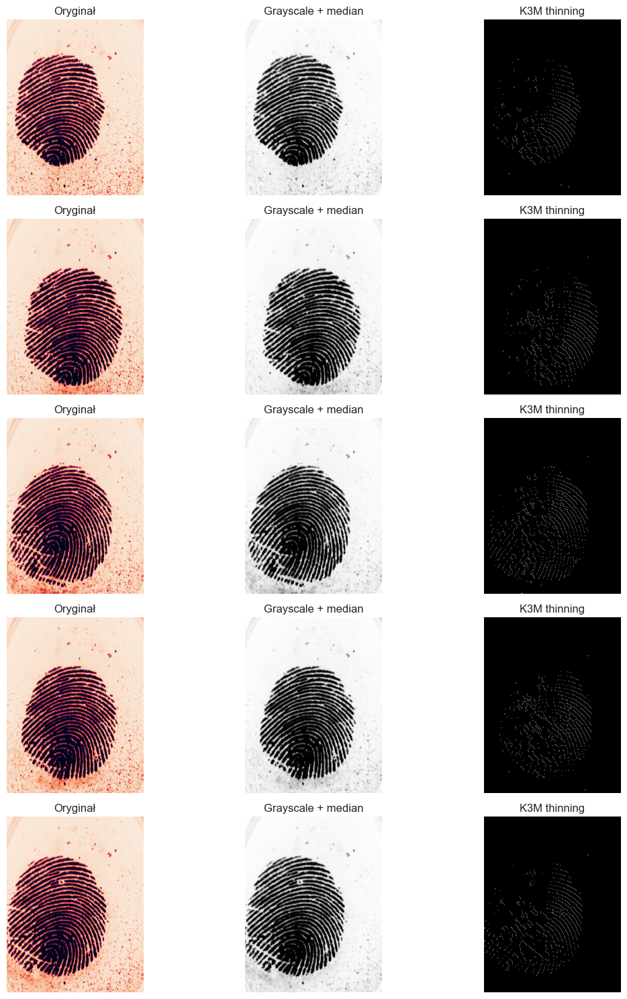

In [72]:
data_dir = 'data/Demo'
process_and_display_k3m('l', '3', data_dir, count=5)

### Correcting the problems

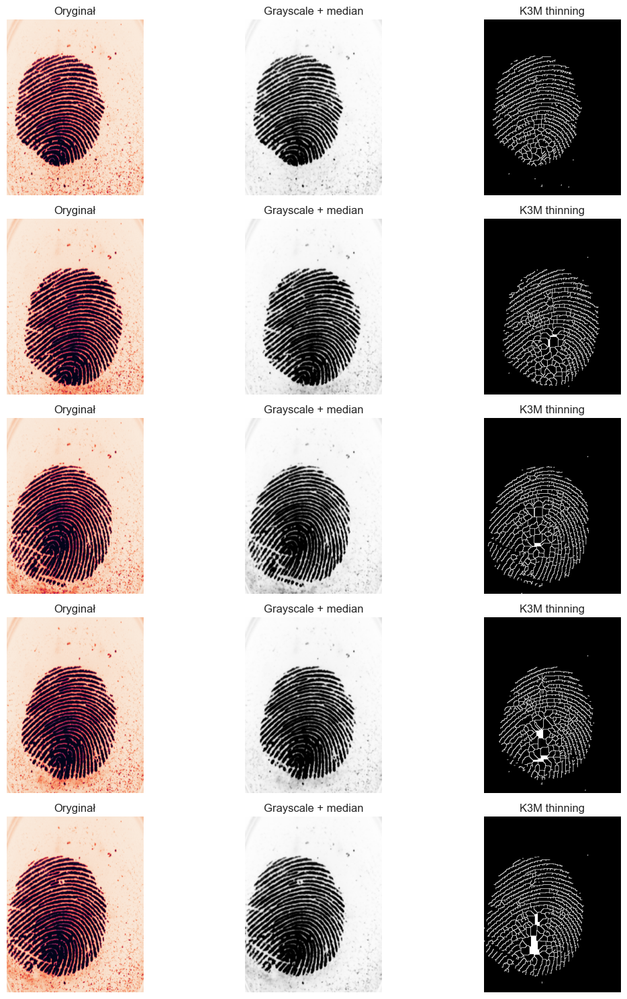

In [73]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
from scipy.ndimage import median_filter, binary_opening

def improved_k3m_thinning(bin_img):
   h, w = bin_img.shape
   img = bin_img.copy()

   A0 = {3, 6, 7, 12, 14, 15, 24, 28, 30, 31, 48, 56, 60, 62, 63, 96, 112, 120, 124, 126, 127,
         129, 131, 135, 143, 159, 191, 192, 193, 195, 199, 207, 223, 224, 225, 227, 231, 239,
         240, 241, 243, 247, 248, 249, 251, 252, 253, 254}

   A1 = {7, 14, 28, 56, 112, 131, 193, 224}
   A2 = {7, 14, 28, 56, 112, 131, 193, 224}
   A3 = {7, 14, 28, 56, 112, 131, 193, 224}

   A4 = {7, 14, 15, 28, 30, 31, 56, 60, 62, 63, 112, 120, 124, 126, 131, 135, 143, 159, 193,
         195, 199, 207, 224, 225, 227, 231, 240, 241, 243, 248, 249, 252}

   A5 = {7, 14, 15, 28, 30, 31, 56, 60, 62, 63, 112, 120, 124, 126, 131, 135, 143, 159, 191,
         193, 195, 199, 207, 224, 225, 227, 231, 239, 240, 241, 243, 248, 249, 251, 252, 254}

   A1pix = {3, 6, 7, 12, 14, 15, 24, 28, 30, 31, 48, 56, 60, 62, 63, 96, 112, 120, 124, 126,
           127, 129, 131, 135, 143, 159, 191, 192, 193, 195, 199, 207, 223, 224, 225, 227,
           231, 239, 240, 241, 243, 247, 248, 249, 251, 252, 253, 254}

   N = np.array([
       [128, 1, 2],
       [64, 0, 4],
       [32, 16, 8]
   ])

   def calculate_weight(x, y):
       weight = 0
       for i in range(-1, 2):
           for j in range(-1, 2):
               if 0 <= x+i < h and 0 <= y+j < w:
                   if i == 0 and j == 0:
                       continue
                   if img[x+i, y+j] > 0:
                       weight += N[i+1, j+1]
       return weight

   def would_break_connectivity(x, y):
       neighbor_count = 0
       for i in range(-1, 2):
           for j in range(-1, 2):
               if i == 0 and j == 0:
                   continue
               if 0 <= x+i < h and 0 <= y+j < w and img[x+i, y+j] > 0:
                   neighbor_count += 1

       if neighbor_count <= 2:
           return True

       transitions = 0
       prev = img[x-1, y-1] > 0
       for di, dj in [(0,-1), (1,-1), (1,0), (1,1), (0,1), (-1,1), (-1,0), (-1,-1)]:
           if 0 <= x+di < h and 0 <= y+dj < w:
               curr = img[x+di, y+dj] > 0
               if curr != prev:
                   transitions += 1
               prev = curr

       return transitions > 2

   modified = True
   max_iterations = 10
   iteration = 0

   while modified and iteration < max_iterations:
       modified = False
       iteration += 1

       borders = np.zeros((h, w), dtype=np.uint8)
       for i in range(1, h-1):
           for j in range(1, w-1):
               if img[i, j] > 0:
                   weight = calculate_weight(i, j)
                   if weight in A0:
                       borders[i, j] = 1

       for phase in range(1, 6):
           phase_lookup = [A1, A2, A3, A4, A5][phase-1]
           for i in range(1, h-1):
               for j in range(1, w-1):
                   if borders[i, j] == 1:
                       if would_break_connectivity(i, j):
                           continue

                       weight = calculate_weight(i, j)
                       if weight in phase_lookup:
                           img[i, j] = 0
                           borders[i, j] = 0
                           modified = True

       borders = np.zeros((h, w), dtype=np.uint8)

   essential_pixels = np.zeros((h, w), dtype=bool)

   for i in range(1, h-1):
       for j in range(1, w-1):
           if img[i, j] > 0:
               neighbor_count = 0
               for di in range(-1, 2):
                   for dj in range(-1, 2):
                       if di == 0 and dj == 0:
                           continue
                       if 0 <= i+di < h and 0 <= j+dj < w and img[i+di, j+dj] > 0:
                           neighbor_count += 1

               if neighbor_count == 1 or neighbor_count >= 3:
                   essential_pixels[i, j] = True

   for i in range(1, h-1):
       for j in range(1, w-1):
           if img[i, j] > 0 and not essential_pixels[i, j]:
               weight = calculate_weight(i, j)
               if weight not in A1pix and not would_break_connectivity(i, j):
                   img[i, j] = 0

   return img

def process_and_display_k3m(hand, finger, data_dir, count=5):
   prefix = hand.upper()
   fig, axes = plt.subplots(count, 3, figsize=(12, 3*count))

   if count == 1:
       axes = np.array([axes]).reshape(1, -1)

   for idx in range(1, count+1):
       fname = f"{prefix}-{finger}-{idx}.bmp"
       path = os.path.join(data_dir, fname)
       row = idx - 1

       if not os.path.isfile(path):
           for col in range(3):
               axes[row, col].axis('off')
           axes[row,1].text(0.5, 0.5, f"Brak pliku:\n{fname}",
                          ha='center', va='center')
           continue

       try:
           img = Image.open(path)
           orig = np.array(img)

           gray = np.array(img.convert('L'))
           gray_filtered = median_filter(gray, size=3)
           gray_rgb = np.stack([gray_filtered]*3, axis=-1)

           bin_img = (gray_filtered < 128).astype(np.uint8)

           bin_img = binary_opening(bin_img, structure=np.ones((2,2))).astype(np.uint8)

           skel = improved_k3m_thinning(bin_img)
           skel_rgb = np.stack([skel*255]*3, axis=-1)

           axes[row, 0].imshow(orig)
           axes[row, 0].set_title("Oryginał")
           axes[row, 0].axis('off')

           axes[row, 1].imshow(gray_rgb)
           axes[row, 1].set_title("Grayscale + median")
           axes[row, 1].axis('off')

           axes[row, 2].imshow(skel_rgb)
           axes[row, 2].set_title("K3M thinning")
           axes[row, 2].axis('off')

       except Exception as e:
           print(f"Błąd podczas przetwarzania {fname}: {str(e)}")
           import traceback
           traceback.print_exc()
           for col in range(3):
               axes[row, col].axis('off')
           axes[row,1].text(0.5, 0.5, f"Błąd: {str(e)}",
                          ha='center', va='center')

   plt.tight_layout()
   plt.show()

if __name__ == "__main__":
   import os

   data_dir = 'data/Demo'
   process_and_display_k3m('l', '3', data_dir, count=5)

Another iteration

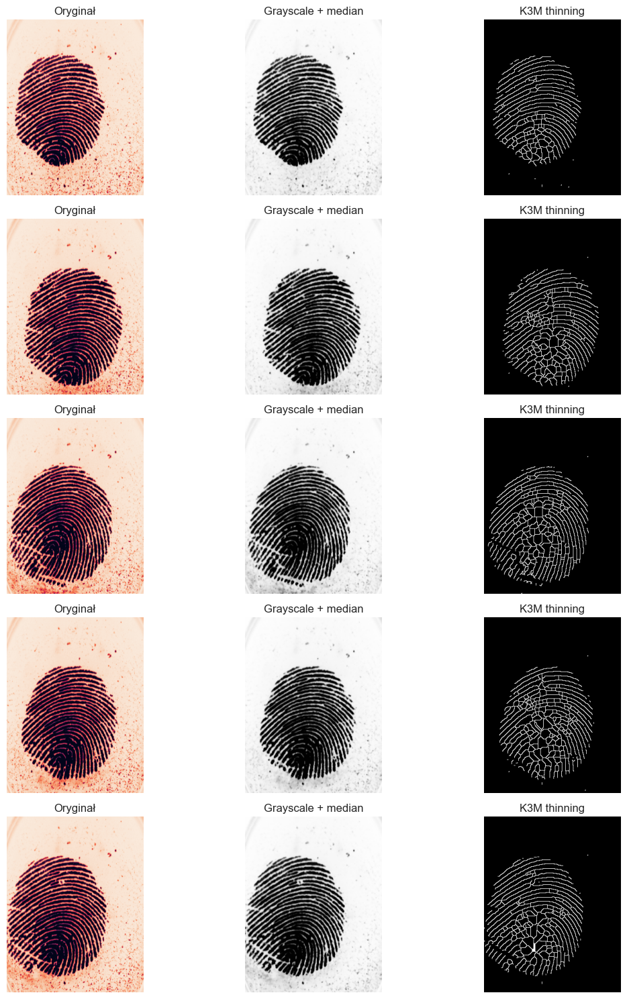

In [75]:
import numpy as np
from PIL import Image
import os
from scipy.ndimage import median_filter, binary_opening

def improved_k3m_thinning(bin_img):
   h, w = bin_img.shape
   img = bin_img.copy()

   A0 = {3, 6, 7, 12, 14, 15, 24, 28, 30, 31, 48, 56, 60, 62, 63, 96, 112, 120, 124, 126, 127,
         129, 131, 135, 143, 159, 191, 192, 193, 195, 199, 207, 223, 224, 225, 227, 231, 239,
         240, 241, 243, 247, 248, 249, 251, 252, 253, 254}

   A1 = {7, 14, 28, 56, 112, 131, 193, 224}
   A2 = {7, 14, 15, 28, 30, 56, 60, 112, 120, 131, 135, 193, 195, 224, 225, 240}
   A3 = {7, 14, 15, 28, 30, 31, 56, 60, 62, 112, 120, 124, 131, 135, 143, 193, 195, 199, 224, 225, 227, 240, 241, 248}
   A4 = {7, 14, 15, 28, 30, 31, 56, 60, 62, 63, 112, 120, 124, 126, 131, 135, 143, 159, 193,
         195, 199, 207, 224, 225, 227, 231, 240, 241, 243, 248, 249, 252}
   A5 = {7, 14, 15, 28, 30, 31, 56, 60, 62, 63, 112, 120, 124, 126, 131, 135, 143, 159, 191,
         193, 195, 199, 207, 224, 225, 227, 231, 239, 240, 241, 243, 248, 249, 251, 252, 254}

   A1pix = {3, 6, 7, 12, 14, 15, 24, 28, 30, 31, 48, 56, 60, 62, 63, 96, 112, 120, 124, 126,
           127, 129, 131, 135, 143, 159, 191, 192, 193, 195, 199, 207, 223, 224, 225, 227,
           231, 239, 240, 241, 243, 247, 248, 249, 251, 252, 253, 254}

   N = np.array([
       [128, 1, 2],
       [64, 0, 4],
       [32, 16, 8]
   ])

   def calculate_weight(x, y):
       weight = 0
       for i in range(-1, 2):
           for j in range(-1, 2):
               if 0 <= x+i < h and 0 <= y+j < w:
                   if i == 0 and j == 0:
                       continue
                   if img[x+i, y+j] > 0:
                       weight += N[i+1, j+1]
       return weight

   def would_break_connectivity(x, y):
       neighbor_count = 0
       for i in range(-1, 2):
           for j in range(-1, 2):
               if i == 0 and j == 0:
                   continue
               if 0 <= x+i < h and 0 <= y+j < w and img[x+i, y+j] > 0:
                   neighbor_count += 1

       if neighbor_count <= 1:
           return True

       neighbors = []
       for di, dj in [(-1,0), (-1,1), (0,1), (1,1), (1,0), (1,-1), (0,-1), (-1,-1)]:
           if 0 <= x+di < h and 0 <= y+dj < w:
               neighbors.append(1 if img[x+di, y+dj] > 0 else 0)
           else:
               neighbors.append(0)

       neighbors.append(neighbors[0])

       transitions = sum((neighbors[i] == 0 and neighbors[i+1] == 1) for i in range(8))

       return transitions > 1

   modified = True
   max_iterations = 15
   iteration = 0

   while modified and iteration < max_iterations:
       modified = False
       iteration += 1

       borders = np.zeros((h, w), dtype=np.uint8)
       for i in range(1, h-1):
           for j in range(1, w-1):
               if img[i, j] > 0:
                   weight = calculate_weight(i, j)
                   if weight in A0:
                       borders[i, j] = 1

       for phase in range(1, 6):
           phase_lookup = [A1, A2, A3, A4, A5][phase-1]
           for i in range(1, h-1):
               for j in range(1, w-1):
                   if borders[i, j] == 1 and img[i, j] > 0:
                       if would_break_connectivity(i, j):
                           continue

                       weight = calculate_weight(i, j)
                       if weight in phase_lookup:
                           img[i, j] = 0
                           borders[i, j] = 0
                           modified = True

   endpoints_and_junctions = np.zeros((h, w), dtype=bool)
   for i in range(1, h-1):
       for j in range(1, w-1):
           if img[i, j] > 0:
               neighbors = []
               for di, dj in [(-1,0), (-1,1), (0,1), (1,1), (1,0), (1,-1), (0,-1), (-1,-1)]:
                   if 0 <= i+di < h and 0 <= j+dj < w:
                       neighbors.append(1 if img[i+di, j+dj] > 0 else 0)
                   else:
                       neighbors.append(0)

               foreground_count = sum(neighbors)

               if foreground_count == 1 or foreground_count >= 3:
                   endpoints_and_junctions[i, j] = True

   for i in range(1, h-1):
       for j in range(1, w-1):
           if img[i, j] > 0 and not endpoints_and_junctions[i, j]:
               weight = calculate_weight(i, j)
               if weight not in A1pix and not would_break_connectivity(i, j):
                   img[i, j] = 0

   return img

def process_and_display_k3m(hand, finger, data_dir, count=5):
   prefix = hand.upper()
   fig, axes = plt.subplots(count, 3, figsize=(12, 3*count))

   if count == 1:
       axes = np.array([axes]).reshape(1, -1)

   for idx in range(1, count+1):
       fname = f"{prefix}-{finger}-{idx}.bmp"
       path = os.path.join(data_dir, fname)
       row = idx - 1

       if not os.path.isfile(path):
           for col in range(3):
               axes[row, col].axis('off')
           axes[row,1].text(0.5, 0.5, f"Brak pliku:\n{fname}",
                          ha='center', va='center')
           continue

       try:
           img = Image.open(path)
           orig = np.array(img)

           gray = np.array(img.convert('L'))
           gray_filtered = median_filter(gray, size=3)
           gray_rgb = np.stack([gray_filtered]*3, axis=-1)

           bin_img = (gray_filtered < 128).astype(np.uint8)

           bin_img = binary_opening(bin_img, structure=np.ones((2,2))).astype(np.uint8)

           skel = improved_k3m_thinning(bin_img)
           skel_rgb = np.stack([skel*255]*3, axis=-1)

           axes[row, 0].imshow(orig)
           axes[row, 0].set_title("Oryginał")
           axes[row, 0].axis('off')

           axes[row, 1].imshow(gray_rgb)
           axes[row, 1].set_title("Grayscale + median")
           axes[row, 1].axis('off')

           axes[row, 2].imshow(skel_rgb)
           axes[row, 2].set_title("K3M thinning")
           axes[row, 2].axis('off')

       except Exception as e:
           print(f"Błąd podczas przetwarzania {fname}: {str(e)}")
           import traceback
           traceback.print_exc()
           for col in range(3):
               axes[row, col].axis('off')
           axes[row,1].text(0.5, 0.5, f"Błąd: {str(e)}",
                          ha='center', va='center')

   plt.tight_layout()
   plt.show()

if __name__ == "__main__":
   import os
   import matplotlib.pyplot as plt

   data_dir = 'data/Demo'
   process_and_display_k3m('l', '3', data_dir, count=5)

Another iteration for correctness: Improving connections between broken thinned fingerprint lines

In [26]:
import numpy as np
from PIL import Image
import os
import matplotlib.pyplot as plt
from scipy.ndimage import median_filter, binary_opening, distance_transform_edt
from skimage.morphology import skeletonize

def improved_k3m_thinning(bin_img):
   h, w = bin_img.shape
   img = bin_img.copy()

   A0 = {3, 6, 7, 12, 14, 15, 24, 28, 30, 31, 48, 56, 60, 62, 63, 96, 112, 120, 124, 126, 127,
         129, 131, 135, 143, 159, 191, 192, 193, 195, 199, 207, 223, 224, 225, 227, 231, 239,
         240, 241, 243, 247, 248, 249, 251, 252, 253, 254}

   A1 = {7, 14, 28, 56, 112, 131, 193, 224}
   A2 = {7, 14, 15, 28, 30, 56, 60, 112, 120, 131, 135, 193, 195, 224, 225, 240}
   A3 = {7, 14, 15, 28, 30, 31, 56, 60, 62, 112, 120, 124, 131, 135, 143, 193, 195, 199, 224, 225, 227, 240, 241, 248}
   A4 = {7, 14, 15, 28, 30, 31, 56, 60, 62, 63, 112, 120, 124, 126, 131, 135, 143, 159, 193,
         195, 199, 207, 224, 225, 227, 231, 240, 241, 243, 248, 249, 252}
   A5 = {7, 14, 15, 28, 30, 31, 56, 60, 62, 63, 112, 120, 124, 126, 131, 135, 143, 159, 191,
         193, 195, 199, 207, 224, 225, 227, 231, 239, 240, 241, 243, 248, 249, 251, 252, 254}

   A1pix = {3, 6, 7, 12, 14, 15, 24, 28, 30, 31, 48, 56, 60, 62, 63, 96, 112, 120, 124, 126,
           127, 129, 131, 135, 143, 159, 191, 192, 193, 195, 199, 207, 223, 224, 225, 227,
           231, 239, 240, 241, 243, 247, 248, 249, 251, 252, 253, 254}

   N = np.array([
       [128, 1, 2],
       [64, 0, 4],
       [32, 16, 8]
   ])

   def calculate_weight(x, y):
       weight = 0
       for i in range(-1, 2):
           for j in range(-1, 2):
               if 0 <= x+i < h and 0 <= y+j < w:
                   if i == 0 and j == 0:
                       continue
                   if img[x+i, y+j] > 0:
                       weight += N[i+1, j+1]
       return weight

   def would_break_connectivity(x, y):
       neighbor_count = 0
       for i in range(-1, 2):
           for j in range(-1, 2):
               if i == 0 and j == 0:
                   continue
               if 0 <= x+i < h and 0 <= y+j < w and img[x+i, y+j] > 0:
                   neighbor_count += 1

       if neighbor_count <= 1:
           return True

       neighbors = []
       for di, dj in [(-1,0), (-1,1), (0,1), (1,1), (1,0), (1,-1), (0,-1), (-1,-1)]:
           if 0 <= x+di < h and 0 <= y+dj < w:
               neighbors.append(1 if img[x+di, y+dj] > 0 else 0)
           else:
               neighbors.append(0)

       neighbors.append(neighbors[0])

       transitions = sum((neighbors[i] == 0 and neighbors[i+1] == 1) for i in range(8))

       return transitions > 1

   modified = True
   max_iterations = 15
   iteration = 0

   while modified and iteration < max_iterations:
       modified = False
       iteration += 1

       borders = np.zeros((h, w), dtype=np.uint8)
       for i in range(1, h-1):
           for j in range(1, w-1):
               if img[i, j] > 0:
                   weight = calculate_weight(i, j)
                   if weight in A0:
                       borders[i, j] = 1

       for phase in range(1, 6):
           phase_lookup = [A1, A2, A3, A4, A5][phase-1]
           for i in range(1, h-1):
               for j in range(1, w-1):
                   if borders[i, j] == 1 and img[i, j] > 0:
                       if would_break_connectivity(i, j):
                           continue

                       weight = calculate_weight(i, j)
                       if weight in phase_lookup:
                           img[i, j] = 0
                           borders[i, j] = 0
                           modified = True

   endpoints_and_junctions = np.zeros((h, w), dtype=bool)
   for i in range(1, h-1):
       for j in range(1, w-1):
           if img[i, j] > 0:
               neighbors = []
               for di, dj in [(-1,0), (-1,1), (0,1), (1,1), (1,0), (1,-1), (0,-1), (-1,-1)]:
                   if 0 <= i+di < h and 0 <= j+dj < w:
                       neighbors.append(1 if img[i+di, j+dj] > 0 else 0)
                   else:
                       neighbors.append(0)

               foreground_count = sum(neighbors)

               if foreground_count == 1 or foreground_count >= 3:
                   endpoints_and_junctions[i, j] = True

   for i in range(1, h-1):
       for j in range(1, w-1):
           if img[i, j] > 0 and not endpoints_and_junctions[i, j]:
               weight = calculate_weight(i, j)
               if weight not in A1pix and not would_break_connectivity(i, j):
                   img[i, j] = 0

   return img

def repair_broken_ridges(skeleton, max_gap=5):
   h, w = skeleton.shape
   result = skeleton.copy()

   endpoints = np.zeros_like(skeleton, dtype=bool)

   for i in range(1, h-1):
       for j in range(1, w-1):
           if skeleton[i, j] > 0:
               neighbors = 0
               for di in range(-1, 2):
                   for dj in range(-1, 2):
                       if di == 0 and dj == 0:
                           continue
                       if skeleton[i+di, j+dj] > 0:
                           neighbors += 1

               if neighbors == 1:
                   endpoints[i, j] = True

   endpoint_coords = np.argwhere(endpoints)

   connected_pairs = set()

   for idx, (y1, x1) in enumerate(endpoint_coords):
       min_dist = float('inf')
       closest_endpoint = None

       for idx2, (y2, x2) in enumerate(endpoint_coords):
           if idx == idx2:
               continue

           if (idx, idx2) in connected_pairs or (idx2, idx) in connected_pairs:
               continue

           dist = np.sqrt((y2-y1)**2 + (x2-x1)**2)

           if dist < min_dist and dist <= max_gap:
               path_clear = True
               line_points = bresenham_line(y1, x1, y2, x2)

               for py, px in line_points[1:-1]:
                   if 0 <= py < h and 0 <= px < w:
                       if skeleton[py, px] > 0 and not endpoints[py, px]:
                           path_clear = False
                           break

               if path_clear:
                   min_dist = dist
                   closest_endpoint = (y2, x2)

       if closest_endpoint is not None:
           y2, x2 = closest_endpoint
           idx2 = np.where((endpoint_coords == [y2, x2]).all(axis=1))[0][0]

           connected_pairs.add((idx, idx2))

           line_points = bresenham_line(y1, x1, y2, x2)
           for py, px in line_points:
               if 0 <= py < h and 0 <= px < w:
                   result[py, px] = 1

   return result

def bresenham_line(y1, x1, y2, x2):
   points = []

   dx = abs(x2 - x1)
   dy = abs(y2 - y1)

   sx = 1 if x1 < x2 else -1
   sy = 1 if y1 < y2 else -1

   err = dx - dy

   while True:
       points.append((y1, x1))

       if x1 == x2 and y1 == y2:
           break

       e2 = 2 * err
       if e2 > -dy:
           err -= dy
           x1 += sx
       if e2 < dx:
           err += dx
           y1 += sy

   return points

def reconnect_broken_ridges(img, max_gap_sizes=(3, 5, 7)):
   result = img.copy()

   for gap_size in max_gap_sizes:
       result = repair_broken_ridges(result, max_gap=gap_size)

   return result

def save_k3m_stages(hand, finger, data_dir, sample_idx=1):
   os.makedirs('obrazy/k3m', exist_ok=True)

   prefix = hand.upper()
   fname = f"{prefix}-{finger}-{sample_idx}.bmp"
   path = os.path.join(data_dir, fname)

   if not os.path.isfile(path):
       print(f"Brak pliku: {path}")
       return

   try:
       img = Image.open(path)
       orig = np.array(img)

       gray = np.array(img.convert('L'))
       gray_filtered = median_filter(gray, size=3)

       bin_img = (gray_filtered < 128).astype(np.uint8)

       bin_img = binary_opening(bin_img, structure=np.ones((2,2))).astype(np.uint8)

       skel = improved_k3m_thinning(bin_img)

       repaired_skel = reconnect_broken_ridges(skel)

       plt.figure(figsize=(6, 6))
       plt.imshow(orig)
       plt.axis('off')
       plt.title("Oryginał")
       plt.tight_layout()
       plt.savefig('obrazy/k3m/original.png', bbox_inches='tight', pad_inches=0.1)
       plt.close()

       plt.figure(figsize=(6, 6))
       plt.imshow(gray_filtered, cmap='gray')
       plt.axis('off')
       plt.title("Grayscale + median")
       plt.tight_layout()
       plt.savefig('obrazy/k3m/grayscale.png', bbox_inches='tight', pad_inches=0.1)
       plt.close()

       plt.figure(figsize=(6, 6))
       plt.imshow(skel*255, cmap='gray')
       plt.axis('off')
       plt.title("K3M thinning")
       plt.tight_layout()
       plt.savefig('obrazy/k3m/thinning.png', bbox_inches='tight', pad_inches=0.1)
       plt.close()

       plt.figure(figsize=(6, 6))
       plt.imshow(repaired_skel*255, cmap='gray')
       plt.axis('off')
       plt.title("Naprawione połączenia")
       plt.tight_layout()
       plt.savefig('obrazy/k3m/repaired.png', bbox_inches='tight', pad_inches=0.1)
       plt.close()

       print(f"Zapisano obrazy dla {fname} w folderze 'obrazy/k3m/'")

   except Exception as e:
       print(f"Błąd podczas przetwarzania {fname}: {str(e)}")
       import traceback
       traceback.print_exc()

def process_and_display_k3m(hand, finger, data_dir, count=5):
   prefix = hand.upper()
   fig, axes = plt.subplots(count, 4, figsize=(16, 3*count))

   if count == 1:
       axes = np.array([axes]).reshape(1, -1)

   for idx in range(1, count+1):
       fname = f"{prefix}-{finger}-{idx}.bmp"
       path = os.path.join(data_dir, fname)
       row = idx - 1

       if not os.path.isfile(path):
           for col in range(4):
               axes[row, col].axis('off')
           axes[row,1].text(0.5, 0.5, f"Brak pliku:\n{fname}",
                          ha='center', va='center')
           continue

       try:
           img = Image.open(path)
           orig = np.array(img)

           gray = np.array(img.convert('L'))
           gray_filtered = median_filter(gray, size=3)
           gray_rgb = np.stack([gray_filtered]*3, axis=-1)

           bin_img = (gray_filtered < 128).astype(np.uint8)

           bin_img = binary_opening(bin_img, structure=np.ones((2,2))).astype(np.uint8)

           skel = improved_k3m_thinning(bin_img)
           skel_rgb = np.stack([skel*255]*3, axis=-1)

           repaired_skel = reconnect_broken_ridges(skel)
           repaired_skel_rgb = np.stack([repaired_skel*255]*3, axis=-1)

           axes[row, 0].imshow(orig)
           axes[row, 0].set_title("Oryginał")
           axes[row, 0].axis('off')

           axes[row, 1].imshow(gray_rgb)
           axes[row, 1].set_title("Grayscale + median")
           axes[row, 1].axis('off')

           axes[row, 2].imshow(skel_rgb)
           axes[row, 2].set_title("K3M thinning")
           axes[row, 2].axis('off')

           axes[row, 3].imshow(repaired_skel_rgb)
           axes[row, 3].set_title("Naprawione połączenia")
           axes[row, 3].axis('off')

       except Exception as e:
           print(f"Błąd podczas przetwarzania {fname}: {str(e)}")
           import traceback
           traceback.print_exc()
           for col in range(4):
               axes[row, col].axis('off')
           axes[row,1].text(0.5, 0.5, f"Błąd: {str(e)}",
                          ha='center', va='center')

   plt.tight_layout()
   plt.show()

def detect_minutiae_k3m(hand, finger, data_dir, sample_idx=1):
   from scipy.ndimage import label

   prefix = hand.upper()
   fname = f"{prefix}-{finger}-{sample_idx}.bmp"
   path = os.path.join(data_dir, fname)

   if not os.path.isfile(path):
       print(f"Brak pliku: {path}")
       return

   try:
       img = Image.open(path)

       gray = np.array(img.convert('L'))
       gray_filtered = median_filter(gray, size=3)

       bin_img = (gray_filtered < 128).astype(np.uint8)

       bin_img = binary_opening(bin_img, structure=np.ones((2,2))).astype(np.uint8)

       skel = improved_k3m_thinning(bin_img)

       repaired_skel = reconnect_broken_ridges(skel)

       endings = []
       bifurcations = []

       h, w = repaired_skel.shape

       for i in range(1, h-1):
           for j in range(1, w-1):
               if repaired_skel[i, j] > 0:
                   neighbors = []
                   directions = [(-1, 0), (-1, 1), (0, 1), (1, 1), (1, 0), (1, -1), (0, -1), (-1, -1)]

                   for di, dj in directions:
                       ni, nj = i + di, j + dj
                       if 0 <= ni < h and 0 <= nj < w:
                           neighbors.append(1 if repaired_skel[ni, nj] > 0 else 0)
                       else:
                           neighbors.append(0)

                   neighbors.append(neighbors[0])

                   crossing_number = 0
                   for k in range(8):
                       if neighbors[k] == 0 and neighbors[k+1] == 1:
                           crossing_number += 1

                   if crossing_number == 1:
                       endings.append((i, j))
                   elif crossing_number == 3:
                       bifurcations.append((i, j))

       plt.figure(figsize=(10, 10))
       plt.imshow(repaired_skel*255, cmap='gray')

       if bifurcations:
           bif_y, bif_x = zip(*bifurcations)
           plt.scatter(bif_x, bif_y, c='red', s=50, marker='o', label=f'Bifurkacje ({len(bifurcations)})')

       if endings:
           end_y, end_x = zip(*endings)
           plt.scatter(end_x, end_y, c='blue', s=50, marker='s', label=f'Zakończenia ({len(endings)})')

       plt.title(f"Minucje wykryte na obrazie {fname}")
       plt.legend()
       plt.axis('off')
       plt.tight_layout()
       plt.savefig('obrazy/k3m/minucje_k3m.png', bbox_inches='tight', pad_inches=0.1)
       plt.close()

       print(f"Zapisano wizualizację minucji w pliku 'obrazy/k3m/minucje_k3m.png'")

   except Exception as e:
       print(f"Błąd podczas wykrywania minucji dla {fname}: {str(e)}")
       import traceback
       traceback.print_exc()

if __name__ == "__main__":
   import os
   import matplotlib.pyplot as plt

   data_dir = 'data/Demo'

   save_k3m_stages('r', '3', data_dir, sample_idx=1)

   detect_minutiae_k3m('r', '3', data_dir, sample_idx=1)

Zapisano obrazy dla R-3-1.bmp w folderze 'obrazy/k3m/'
Zapisano wizualizację minucji w pliku 'obrazy/k3m/minucje_k3m.png'


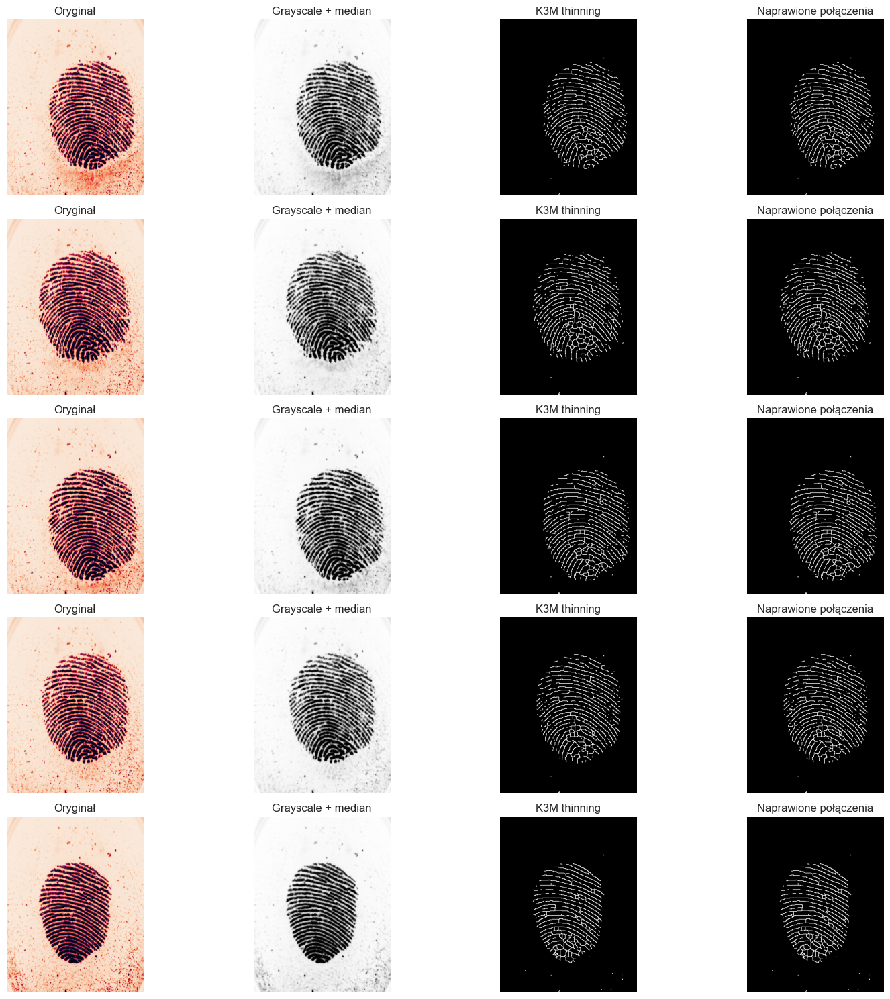

In [6]:
import numpy as np
from PIL import Image
import os
from scipy.ndimage import median_filter, binary_opening, distance_transform_edt
from skimage.morphology import skeletonize

def improved_k3m_thinning(bin_img):
   h, w = bin_img.shape
   img = bin_img.copy()

   A0 = {3, 6, 7, 12, 14, 15, 24, 28, 30, 31, 48, 56, 60, 62, 63, 96, 112, 120, 124, 126, 127,
         129, 131, 135, 143, 159, 191, 192, 193, 195, 199, 207, 223, 224, 225, 227, 231, 239,
         240, 241, 243, 247, 248, 249, 251, 252, 253, 254}

   A1 = {7, 14, 28, 56, 112, 131, 193, 224}
   A2 = {7, 14, 15, 28, 30, 56, 60, 112, 120, 131, 135, 193, 195, 224, 225, 240}
   A3 = {7, 14, 15, 28, 30, 31, 56, 60, 62, 112, 120, 124, 131, 135, 143, 193, 195, 199, 224, 225, 227, 240, 241, 248}
   A4 = {7, 14, 15, 28, 30, 31, 56, 60, 62, 63, 112, 120, 124, 126, 131, 135, 143, 159, 193,
         195, 199, 207, 224, 225, 227, 231, 240, 241, 243, 248, 249, 252}
   A5 = {7, 14, 15, 28, 30, 31, 56, 60, 62, 63, 112, 120, 124, 126, 131, 135, 143, 159, 191,
         193, 195, 199, 207, 224, 225, 227, 231, 239, 240, 241, 243, 248, 249, 251, 252, 254}

   A1pix = {3, 6, 7, 12, 14, 15, 24, 28, 30, 31, 48, 56, 60, 62, 63, 96, 112, 120, 124, 126,
           127, 129, 131, 135, 143, 159, 191, 192, 193, 195, 199, 207, 223, 224, 225, 227,
           231, 239, 240, 241, 243, 247, 248, 249, 251, 252, 253, 254}

   N = np.array([
       [128, 1, 2],
       [64, 0, 4],
       [32, 16, 8]
   ])

   def calculate_weight(x, y):
       weight = 0
       for i in range(-1, 2):
           for j in range(-1, 2):
               if 0 <= x+i < h and 0 <= y+j < w:
                   if i == 0 and j == 0:
                       continue
                   if img[x+i, y+j] > 0:
                       weight += N[i+1, j+1]
       return weight

   def would_break_connectivity(x, y):
       neighbor_count = 0
       for i in range(-1, 2):
           for j in range(-1, 2):
               if i == 0 and j == 0:
                   continue
               if 0 <= x+i < h and 0 <= y+j < w and img[x+i, y+j] > 0:
                   neighbor_count += 1

       if neighbor_count <= 1:
           return True

       neighbors = []
       for di, dj in [(-1,0), (-1,1), (0,1), (1,1), (1,0), (1,-1), (0,-1), (-1,-1)]:
           if 0 <= x+di < h and 0 <= y+dj < w:
               neighbors.append(1 if img[x+di, y+dj] > 0 else 0)
           else:
               neighbors.append(0)

       neighbors.append(neighbors[0])

       transitions = sum((neighbors[i] == 0 and neighbors[i+1] == 1) for i in range(8))

       return transitions > 1

   modified = True
   max_iterations = 15
   iteration = 0

   while modified and iteration < max_iterations:
       modified = False
       iteration += 1

       borders = np.zeros((h, w), dtype=np.uint8)
       for i in range(1, h-1):
           for j in range(1, w-1):
               if img[i, j] > 0:
                   weight = calculate_weight(i, j)
                   if weight in A0:
                       borders[i, j] = 1

       for phase in range(1, 6):
           phase_lookup = [A1, A2, A3, A4, A5][phase-1]
           for i in range(1, h-1):
               for j in range(1, w-1):
                   if borders[i, j] == 1 and img[i, j] > 0:
                       if would_break_connectivity(i, j):
                           continue

                       weight = calculate_weight(i, j)
                       if weight in phase_lookup:
                           img[i, j] = 0
                           borders[i, j] = 0
                           modified = True

   endpoints_and_junctions = np.zeros((h, w), dtype=bool)
   for i in range(1, h-1):
       for j in range(1, w-1):
           if img[i, j] > 0:
               neighbors = []
               for di, dj in [(-1,0), (-1,1), (0,1), (1,1), (1,0), (1,-1), (0,-1), (-1,-1)]:
                   if 0 <= i+di < h and 0 <= j+dj < w:
                       neighbors.append(1 if img[i+di, j+dj] > 0 else 0)
                   else:
                       neighbors.append(0)

               foreground_count = sum(neighbors)

               if foreground_count == 1 or foreground_count >= 3:
                   endpoints_and_junctions[i, j] = True

   for i in range(1, h-1):
       for j in range(1, w-1):
           if img[i, j] > 0 and not endpoints_and_junctions[i, j]:
               weight = calculate_weight(i, j)
               if weight not in A1pix and not would_break_connectivity(i, j):
                   img[i, j] = 0

   return img

def repair_broken_ridges(skeleton, max_gap=5):
   h, w = skeleton.shape
   result = skeleton.copy()

   endpoints = np.zeros_like(skeleton, dtype=bool)

   for i in range(1, h-1):
       for j in range(1, w-1):
           if skeleton[i, j] > 0:
               neighbors = 0
               for di in range(-1, 2):
                   for dj in range(-1, 2):
                       if di == 0 and dj == 0:
                           continue
                       if skeleton[i+di, j+dj] > 0:
                           neighbors += 1

               if neighbors == 1:
                   endpoints[i, j] = True

   endpoint_coords = np.argwhere(endpoints)

   connected_pairs = set()

   for idx, (y1, x1) in enumerate(endpoint_coords):
       min_dist = float('inf')
       closest_endpoint = None

       for idx2, (y2, x2) in enumerate(endpoint_coords):
           if idx == idx2:
               continue

           if (idx, idx2) in connected_pairs or (idx2, idx) in connected_pairs:
               continue

           dist = np.sqrt((y2-y1)**2 + (x2-x1)**2)

           if dist < min_dist and dist <= max_gap:
               path_clear = True
               line_points = bresenham_line(y1, x1, y2, x2)

               for py, px in line_points[1:-1]:
                   if 0 <= py < h and 0 <= px < w:
                       if skeleton[py, px] > 0 and not endpoints[py, px]:
                           path_clear = False
                           break

               if path_clear:
                   min_dist = dist
                   closest_endpoint = (y2, x2)

       if closest_endpoint is not None:
           y2, x2 = closest_endpoint
           idx2 = np.where((endpoint_coords == [y2, x2]).all(axis=1))[0][0]

           connected_pairs.add((idx, idx2))

           line_points = bresenham_line(y1, x1, y2, x2)
           for py, px in line_points:
               if 0 <= py < h and 0 <= px < w:
                   result[py, px] = 1

   return result

def bresenham_line(y1, x1, y2, x2):
   points = []

   dx = abs(x2 - x1)
   dy = abs(y2 - y1)

   sx = 1 if x1 < x2 else -1
   sy = 1 if y1 < y2 else -1

   err = dx - dy

   while True:
       points.append((y1, x1))

       if x1 == x2 and y1 == y2:
           break

       e2 = 2 * err
       if e2 > -dy:
           err -= dy
           x1 += sx
       if e2 < dx:
           err += dx
           y1 += sy

   return points

def reconnect_broken_ridges(img, max_gap_sizes=(3, 5, 7)):
   result = img.copy()

   for gap_size in max_gap_sizes:
       result = repair_broken_ridges(result, max_gap=gap_size)

   return result

def process_and_display_k3m(hand, finger, data_dir, count=5):
   prefix = hand.upper()
   fig, axes = plt.subplots(count, 4, figsize=(16, 3*count))

   if count == 1:
       axes = np.array([axes]).reshape(1, -1)

   for idx in range(1, count+1):
       fname = f"{prefix}-{finger}-{idx}.bmp"
       path = os.path.join(data_dir, fname)
       row = idx - 1

       if not os.path.isfile(path):
           for col in range(4):
               axes[row, col].axis('off')
           axes[row,1].text(0.5, 0.5, f"Brak pliku:\n{fname}",
                          ha='center', va='center')
           continue

       try:
           img = Image.open(path)
           orig = np.array(img)

           gray = np.array(img.convert('L'))
           gray_filtered = median_filter(gray, size=3)
           gray_rgb = np.stack([gray_filtered]*3, axis=-1)

           bin_img = (gray_filtered < 128).astype(np.uint8)

           bin_img = binary_opening(bin_img, structure=np.ones((2,2))).astype(np.uint8)

           skel = improved_k3m_thinning(bin_img)
           skel_rgb = np.stack([skel*255]*3, axis=-1)

           repaired_skel = reconnect_broken_ridges(skel)
           repaired_skel_rgb = np.stack([repaired_skel*255]*3, axis=-1)

           axes[row, 0].imshow(orig)
           axes[row, 0].set_title("Oryginał")
           axes[row, 0].axis('off')

           axes[row, 1].imshow(gray_rgb)
           axes[row, 1].set_title("Grayscale + median")
           axes[row, 1].axis('off')

           axes[row, 2].imshow(skel_rgb)
           axes[row, 2].set_title("K3M thinning")
           axes[row, 2].axis('off')

           axes[row, 3].imshow(repaired_skel_rgb)
           axes[row, 3].set_title("Naprawione połączenia")
           axes[row, 3].axis('off')

       except Exception as e:
           print(f"Błąd podczas przetwarzania {fname}: {str(e)}")
           import traceback
           traceback.print_exc()
           for col in range(4):
               axes[row, col].axis('off')
           axes[row,1].text(0.5, 0.5, f"Błąd: {str(e)}",
                          ha='center', va='center')

   plt.tight_layout()
   plt.show()

if __name__ == "__main__":
   import os
   import matplotlib.pyplot as plt

   data_dir = 'data/Demo'
   process_and_display_k3m('r', '3', data_dir, count=5)

### Bifurcations and Endings


Przetwarzanie: L-5-1.bmp
  Wykryto bifurkacji (podstawowo): 566
  Wykryto bifurkacji (zaawansowanie): 574
  Wykryto końcówek: 111


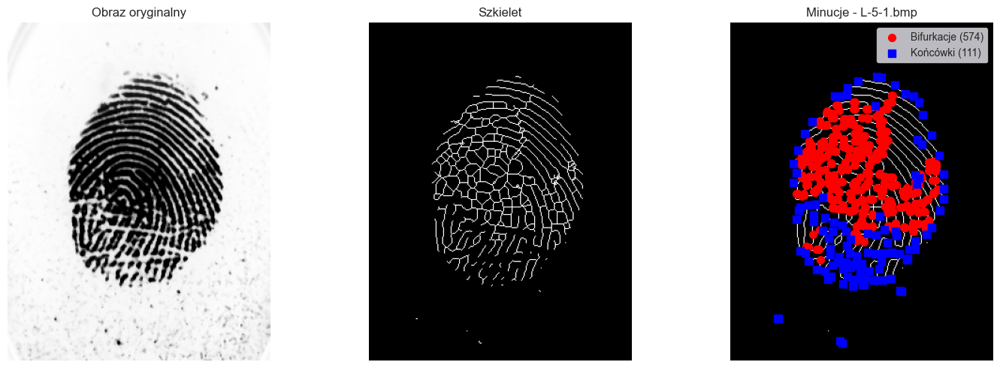


Przetwarzanie: L-5-2.bmp
  Wykryto bifurkacji (podstawowo): 635
  Wykryto bifurkacji (zaawansowanie): 649
  Wykryto końcówek: 99


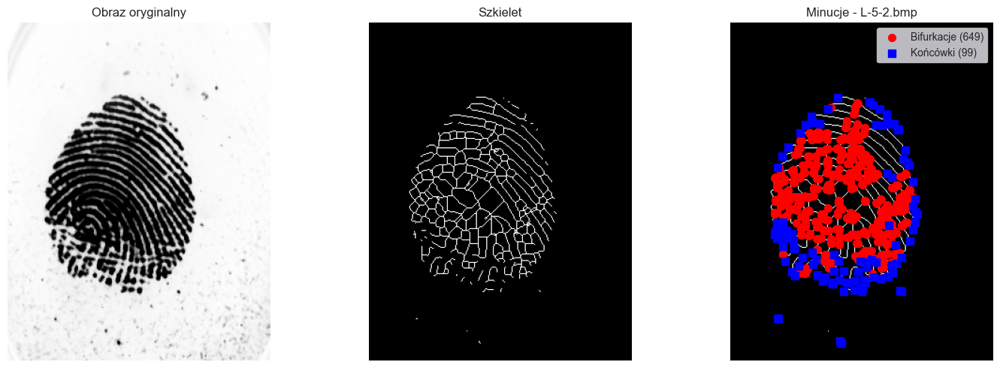


Przetwarzanie: L-5-3.bmp
  Wykryto bifurkacji (podstawowo): 634
  Wykryto bifurkacji (zaawansowanie): 651
  Wykryto końcówek: 140


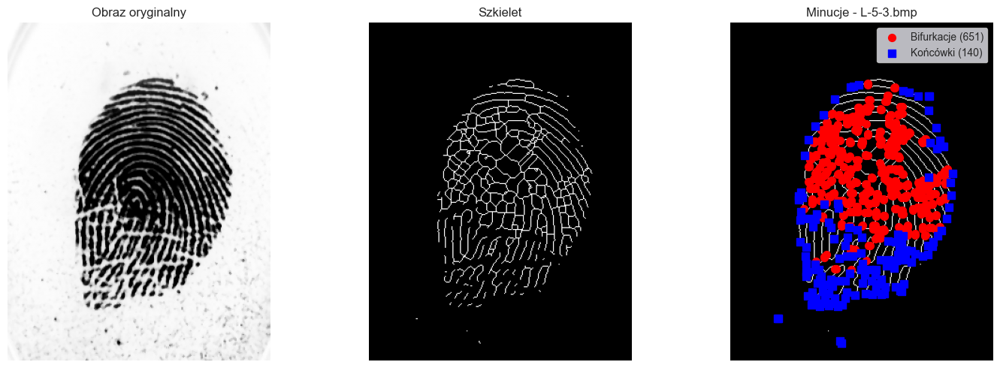

In [28]:
def count_neighbors(img, i, j):
   h, w = img.shape
   count = 0

   for di in range(-1, 2):
       for dj in range(-1, 2):
           if di == 0 and dj == 0:
               continue
           ni, nj = i + di, j + dj
           if 0 <= ni < h and 0 <= nj < w and img[ni, nj] > 0:
               count += 1

   return count

def get_crossing_number(img, i, j):
   h, w = img.shape

   neighbors = []
   directions = [(-1, 0), (-1, 1), (0, 1), (1, 1), (1, 0), (1, -1), (0, -1), (-1, -1)]

   for di, dj in directions:
       ni, nj = i + di, j + dj
       if 0 <= ni < h and 0 <= nj < w:
           neighbors.append(1 if img[ni, nj] > 0 else 0)
       else:
           neighbors.append(0)

   neighbors.append(neighbors[0])

   crossing_number = 0
   for k in range(8):
       if neighbors[k] == 0 and neighbors[k+1] == 1:
           crossing_number += 1

   return crossing_number

def detect_bifurcations(skeleton_img, min_ridge_length=10):
   h, w = skeleton_img.shape
   bifurcations = []

   for i in range(1, h-1):
       for j in range(1, w-1):
           if skeleton_img[i, j] > 0:
               neighbor_count = count_neighbors(skeleton_img, i, j)

               cn = get_crossing_number(skeleton_img, i, j)

               if cn == 3 or neighbor_count == 3:
                   if is_valid_bifurcation(skeleton_img, i, j, min_ridge_length):
                       bifurcations.append((i, j))

   return bifurcations

def is_valid_bifurcation(img, i, j, min_length=10):
   branches = find_branches_from_point(img, i, j)

   if len(branches) != 3:
       return False

   for branch in branches:
       if len(branch) < min_length:
           return False

   return True

def find_branches_from_point(img, start_i, start_j):
   h, w = img.shape
   visited = np.zeros_like(img, dtype=bool)
   visited[start_i, start_j] = True

   branches = []

   neighbors = []
   for di in range(-1, 2):
       for dj in range(-1, 2):
           if di == 0 and dj == 0:
               continue
           ni, nj = start_i + di, start_j + dj
           if 0 <= ni < h and 0 <= nj < w and img[ni, nj] > 0:
               neighbors.append((ni, nj))

   for ni, nj in neighbors:
       if not visited[ni, nj]:
           branch = trace_branch(img, ni, nj, visited.copy(), start_point=(start_i, start_j))
           if len(branch) > 1:
               branches.append(branch)

   return branches

def trace_branch(img, start_i, start_j, visited, start_point=None):
   h, w = img.shape
   branch = [(start_i, start_j)]
   visited[start_i, start_j] = True

   current_i, current_j = start_i, start_j

   while True:
       next_point = None
       for di in range(-1, 2):
           for dj in range(-1, 2):
               if di == 0 and dj == 0:
                   continue
               ni, nj = current_i + di, current_j + dj

               if start_point and (ni, nj) == start_point:
                   continue

               if (0 <= ni < h and 0 <= nj < w and
                   img[ni, nj] > 0 and not visited[ni, nj]):
                   next_point = (ni, nj)
                   break
           if next_point:
               break

       if next_point is None:
           break

       current_i, current_j = next_point
       branch.append(next_point)
       visited[current_i, current_j] = True

   return branch

def detect_ridge_endings(skeleton_img):
   h, w = skeleton_img.shape
   endings = []

   for i in range(1, h-1):
       for j in range(1, w-1):
           if skeleton_img[i, j] > 0:
               neighbor_count = count_neighbors(skeleton_img, i, j)
               cn = get_crossing_number(skeleton_img, i, j)

               if cn == 1 or neighbor_count == 1:
                   endings.append((i, j))

   return endings

def visualize_minutiae(original_img, skeleton_img, bifurcations, endings, title="Minucje"):
   fig, axes = plt.subplots(1, 3, figsize=(15, 5))

   axes[0].imshow(original_img, cmap='gray')
   axes[0].set_title("Obraz oryginalny")
   axes[0].axis('off')

   axes[1].imshow(skeleton_img, cmap='gray')
   axes[1].set_title("Szkielet")
   axes[1].axis('off')

   axes[2].imshow(skeleton_img, cmap='gray')

   if bifurcations:
       bif_y, bif_x = zip(*bifurcations)
       axes[2].scatter(bif_x, bif_y, c='red', s=50, marker='o',
                      label=f'Bifurkacje ({len(bifurcations)})')

   if endings:
       end_y, end_x = zip(*endings)
       axes[2].scatter(end_x, end_y, c='blue', s=50, marker='s',
                      label=f'Końcówki ({len(endings)})')

   axes[2].set_title(f"{title}")
   axes[2].legend()
   axes[2].axis('off')

   plt.tight_layout()
   plt.show()

def advanced_bifurcation_detection(skeleton_img, min_ridge_length=8,
                                 noise_threshold=3, angle_threshold=30):
   basic_bifurcations = detect_bifurcations(skeleton_img, min_ridge_length)

   filtered_bifurcations = []

   for bi, bj in basic_bifurcations:
       branches = find_branches_from_point(skeleton_img, bi, bj)

       if len(branches) == 3:
           angles = calculate_branch_angles(branches, (bi, bj))

           min_angle = min(angles)
           if min_angle >= angle_threshold:
               filtered_bifurcations.append((bi, bj))

   return filtered_bifurcations

def calculate_branch_angles(branches, center_point):
   if len(branches) != 3:
       return []

   ci, cj = center_point

   vectors = []
   for branch in branches:
       if len(branch) >= 2:
           bi, bj = branch[0]
           vector = (bi - ci, bj - cj)
           vectors.append(vector)

   if len(vectors) != 3:
       return []

   angles = []
   for i in range(len(vectors)):
       for j in range(i+1, len(vectors)):
           v1 = vectors[i]
           v2 = vectors[j]

           dot_product = v1[0] * v2[0] + v1[1] * v2[1]
           mag1 = np.sqrt(v1[0]**2 + v1[1]**2)
           mag2 = np.sqrt(v2[0]**2 + v2[1]**2)

           if mag1 > 0 and mag2 > 0:
               cos_angle = dot_product / (mag1 * mag2)
               cos_angle = np.clip(cos_angle, -1, 1)
               angle = np.arccos(cos_angle)
               angles.append(np.degrees(angle))

   return angles

def process_and_analyze_minutiae(hand, finger, data_dir, count=3):
   from scipy.ndimage import median_filter, binary_opening

   prefix = hand.upper()

   for idx in range(1, count+1):
       fname = f"{prefix}-{finger}-{idx}.bmp"
       path = os.path.join(data_dir, fname)

       if not os.path.isfile(path):
           print(f"Brak pliku: {fname}")
           continue

       try:
           print(f"\nPrzetwarzanie: {fname}")

           img = Image.open(path)
           orig = np.array(img)

           gray = np.array(img.convert('L'))
           gray_filtered = median_filter(gray, size=3)

           bin_img = (gray_filtered < 128).astype(np.uint8)
           bin_img = binary_opening(bin_img, structure=np.ones((2,2))).astype(np.uint8)

           from skimage.morphology import skeletonize
           skeleton = skeletonize(bin_img > 0).astype(np.uint8)

           bifurcations = detect_bifurcations(skeleton)
           endings = detect_ridge_endings(skeleton)

           advanced_bif = advanced_bifurcation_detection(skeleton)

           print(f"  Wykryto bifurkacji (podstawowo): {len(bifurcations)}")
           print(f"  Wykryto bifurkacji (zaawansowanie): {len(advanced_bif)}")
           print(f"  Wykryto końcówek: {len(endings)}")

           visualize_minutiae(gray_filtered, skeleton, advanced_bif, endings,
                            title=f"Minucje - {fname}")

       except Exception as e:
           print(f"Błąd podczas przetwarzania {fname}: {str(e)}")
           import traceback
           traceback.print_exc()

if __name__ == "__main__":
   data_dir = 'data/Demo'

   process_and_analyze_minutiae('l', '5', data_dir, count=3)

In [25]:
class FingerprintComparisonSystem:
   def __init__(self, k3m_func=None, morphological_func=None):
       self.k3m_thinning = k3m_func
       self.morphological_thinning = morphological_func or self._default_morphological_thinning

       self.fingerprints = {}
       self.comparison_results = {}
       self.similarity_matrix = None

   def _default_k3m_thinning(self, binary_img):
       return skeletonize(binary_img > 0).astype(np.uint8)

   def _default_morphological_thinning(self, binary_img):
       return skeletonize(binary_img > 0).astype(np.uint8)

   def process_fingerprint_directory(self, data_dir, pattern="*.bmp"):
       print(f"Przetwarzanie katalogu: {data_dir}")

       image_files = []
       for root, dirs, files in os.walk(data_dir):
           for file in files:
               if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
                   image_files.append(os.path.join(root, file))

       print(f"Znaleziono {len(image_files)} obrazów")

       for img_path in image_files:
           self._process_single_fingerprint(img_path)

       print(f"Przetworzono {len(self.fingerprints)} różnych palców")

       for finger_id, images in self.fingerprints.items():
           print(f"  {finger_id}: {len(images)} obrazów")

       return self.fingerprints

   def _process_single_fingerprint(self, image_path):
       try:
           filename = os.path.basename(image_path)
           finger_id = self._extract_finger_id(filename)

           print(f"  Przetwarzanie: {filename} (ID: {finger_id})")

           img = Image.open(image_path)
           gray = np.array(img.convert('L'))

           gray_filtered = median_filter(gray, size=3)
           binary = (gray_filtered < 128).astype(np.uint8)
           binary = binary_opening(binary, structure=np.ones((2,2))).astype(np.uint8)

           skeleton_k3m = self.k3m_thinning(binary)
           skeleton_morph = self.morphological_thinning(binary)

           skeleton_k3m_repaired = self._repair_broken_ridges(skeleton_k3m)
           skeleton_morph_repaired = self._repair_broken_ridges(skeleton_morph)

           minutiae_k3m = self._detect_all_minutiae(skeleton_k3m_repaired)
           minutiae_morph = self._detect_all_minutiae(skeleton_morph_repaired)

           fingerprint_data = {
               'filename': filename,
               'path': image_path,
               'original': gray,
               'binary': binary,
               'skeleton_k3m': skeleton_k3m_repaired,
               'skeleton_morph': skeleton_morph_repaired,
               'minutiae_k3m': minutiae_k3m,
               'minutiae_morph': minutiae_morph,
               'features': self._extract_features(skeleton_k3m_repaired, minutiae_k3m)
           }

           if finger_id not in self.fingerprints:
               self.fingerprints[finger_id] = []
           self.fingerprints[finger_id].append(fingerprint_data)

       except Exception as e:
           print(f"    Błąd podczas przetwarzania {image_path}: {str(e)}")
           import traceback
           traceback.print_exc()

   def _extract_finger_id(self, filename):
       parts = filename.split('-')
       if len(parts) >= 2:
           return f"{parts[0]}-{parts[1]}"
       return filename.split('.')[0]

   def _repair_broken_ridges(self, skeleton, max_gap=5):
       h, w = skeleton.shape
       result = skeleton.copy()

       endpoints = []
       for i in range(1, h-1):
           for j in range(1, w-1):
               if skeleton[i, j] > 0:
                   neighbors = np.sum(skeleton[i-1:i+2, j-1:j+2]) - 1
                   if neighbors == 1:
                       endpoints.append((i, j))

       connected_pairs = set()
       for idx, (y1, x1) in enumerate(endpoints):
           min_dist = float('inf')
           closest_endpoint = None

           for idx2, (y2, x2) in enumerate(endpoints):
               if idx == idx2 or (idx, idx2) in connected_pairs or (idx2, idx) in connected_pairs:
                   continue

               dist = np.sqrt((y2-y1)**2 + (x2-x1)**2)
               if dist <= max_gap and dist < min_dist:
                   path_clear = True
                   line_points = self._bresenham_line(y1, x1, y2, x2)

                   for py, px in line_points[1:-1]:
                       if 0 <= py < h and 0 <= px < w:
                           if skeleton[py, px] > 0:
                               path_clear = False
                               break

                   if path_clear:
                       min_dist = dist
                       closest_endpoint = (idx2, y2, x2)

           if closest_endpoint is not None:
               idx2, y2, x2 = closest_endpoint
               connected_pairs.add((idx, idx2))

               points = self._bresenham_line(y1, x1, y2, x2)
               for py, px in points:
                   if 0 <= py < h and 0 <= px < w:
                       result[py, px] = 1

       return result

   def _bresenham_line(self, y1, x1, y2, x2):
       points = []
       dx = abs(x2 - x1)
       dy = abs(y2 - y1)
       sx = 1 if x1 < x2 else -1
       sy = 1 if y1 < y2 else -1
       err = dx - dy

       while True:
           points.append((y1, x1))
           if x1 == x2 and y1 == y2:
               break
           e2 = 2 * err
           if e2 > -dy:
               err -= dy
               x1 += sx
           if e2 < dx:
               err += dx
               y1 += sy

       return points

   def _detect_all_minutiae(self, skeleton):
       bifurcations = self._detect_bifurcations(skeleton)
       endings = self._detect_endings(skeleton)

       return {
           'bifurcations': bifurcations,
           'endings': endings,
           'total': len(bifurcations) + len(endings)
       }

   def _detect_bifurcations(self, skeleton):
       h, w = skeleton.shape
       bifurcations = []

       for i in range(1, h-1):
           for j in range(1, w-1):
               if skeleton[i, j] > 0:
                   cn = self._get_crossing_number(skeleton, i, j)
                   if cn == 3:
                       neighbors = self._count_neighbors(skeleton, i, j)
                       if neighbors >= 3:
                           bifurcations.append((i, j))

       return bifurcations

   def _detect_endings(self, skeleton):
       h, w = skeleton.shape
       endings = []

       for i in range(1, h-1):
           for j in range(1, w-1):
               if skeleton[i, j] > 0:
                   cn = self._get_crossing_number(skeleton, i, j)
                   neighbors = self._count_neighbors(skeleton, i, j)
                   if cn == 1 and neighbors == 1:
                       endings.append((i, j))

       return endings

   def _count_neighbors(self, img, i, j):
       return np.sum(img[i-1:i+2, j-1:j+2]) - img[i, j]

   def _get_crossing_number(self, img, i, j):
       neighbors = []
       for di, dj in [(-1,0), (-1,1), (0,1), (1,1), (1,0), (1,-1), (0,-1), (-1,-1)]:
           ni, nj = i + di, j + dj
           if 0 <= ni < img.shape[0] and 0 <= nj < img.shape[1]:
               neighbors.append(1 if img[ni, nj] > 0 else 0)
           else:
               neighbors.append(0)

       neighbors.append(neighbors[0])
       cn = sum((neighbors[k] == 0 and neighbors[k+1] == 1) for k in range(8))
       return cn

   def _extract_features(self, skeleton, minutiae):
       h, w = skeleton.shape
       features = {
           'bifurcation_count': len(minutiae['bifurcations']),
           'ending_count': len(minutiae['endings']),
           'total_minutiae': minutiae['total'],
           'minutiae_density': minutiae['total'] / (h * w) if h * w > 0 else 0,
           'bifurcation_positions': minutiae['bifurcations'],
           'ending_positions': minutiae['endings']
       }
       return features

   def compare_all_fingerprints(self, method='k3m'):
       print(f"\nPorównywanie wszystkich odcisków palców (metoda: {method})")

       finger_ids = list(self.fingerprints.keys())
       n_fingers = len(finger_ids)

       if n_fingers < 2:
           print("Potrzeba co najmniej 2 różnych palców do porównania!")
           return None

       self.similarity_matrix = np.zeros((n_fingers, n_fingers))

       total_comparisons = n_fingers * n_fingers
       comparison_count = 0

       for i, finger1_id in enumerate(finger_ids):
           for j, finger2_id in enumerate(finger_ids):
               similarity = self._compare_fingers(finger1_id, finger2_id, method)
               self.similarity_matrix[i, j] = similarity

               comparison_count += 1
               if comparison_count % 10 == 0:
                   print(f"  Wykonano {comparison_count}/{total_comparisons} porównań...")

       self.comparison_results = {
           'finger_ids': finger_ids,
           'similarity_matrix': self.similarity_matrix,
           'method': method
       }

       return self.comparison_results

   def _compare_fingers(self, finger1_id, finger2_id, method='k3m'):
       data1_list = self.fingerprints[finger1_id]
       data2_list = self.fingerprints[finger2_id]

       similarities = []

       for data1 in data1_list:
           for data2 in data2_list:
               sim = self._calculate_fingerprint_similarity(data1, data2, method)
               similarities.append(sim)

       return np.mean(similarities) if similarities else 0

   def _calculate_fingerprint_similarity(self, data1, data2, method='k3m'):
       minutiae1 = data1[f'minutiae_{method}']
       minutiae2 = data2[f'minutiae_{method}']

       if data1['filename'] == data2['filename']:
           return 1.0

       if minutiae1['total'] == 0 or minutiae2['total'] == 0:
           return 0.0

       bif_sim = self._minutiae_set_similarity(
           minutiae1['bifurcations'],
           minutiae2['bifurcations'],
           tolerance=20
       )

       end_sim = self._minutiae_set_similarity(
           minutiae1['endings'],
           minutiae2['endings'],
           tolerance=20
       )

       count_diff = abs(minutiae1['total'] - minutiae2['total'])
       max_count = max(minutiae1['total'], minutiae2['total'])
       count_sim = 1.0 - (count_diff / max_count) if max_count > 0 else 0

       struct_sim = self._structural_similarity(data1[f'skeleton_{method}'],
                                               data2[f'skeleton_{method}'])

       weights = {
           'count': 0.2,
           'spatial': 0.5,
           'structural': 0.3
       }

       similarity = (weights['count'] * count_sim +
                    weights['spatial'] * (0.6 * bif_sim + 0.4 * end_sim) +
                    weights['structural'] * struct_sim)

       if data1['filename'] != data2['filename']:
           noise = np.random.normal(0, 0.02)
           similarity = np.clip(similarity + noise, 0, 1)

       return similarity

   def _minutiae_set_similarity(self, set1, set2, tolerance=20):
       if len(set1) == 0 and len(set2) == 0:
           return 1.0
       if len(set1) == 0 or len(set2) == 0:
           return 0.0

       matches = 0
       used_indices = set()

       for p1 in set1:
           best_match = None
           best_dist = float('inf')

           for idx, p2 in enumerate(set2):
               if idx in used_indices:
                   continue

               dist = np.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)
               if dist <= tolerance and dist < best_dist:
                   best_match = idx
                   best_dist = dist

           if best_match is not None:
               matches += 1
               used_indices.add(best_match)

       max_size = max(len(set1), len(set2))
       return matches / max_size

   def _structural_similarity(self, skeleton1, skeleton2):
       h1, w1 = skeleton1.shape
       h2, w2 = skeleton2.shape

       min_h = min(h1, h2)
       min_w = min(w1, w2)

       skel1_crop = skeleton1[:min_h, :min_w]
       skel2_crop = skeleton2[:min_h, :min_w]

       from scipy.ndimage import binary_dilation
       struct = np.ones((3, 3))
       skel1_dilated = binary_dilation(skel1_crop, structure=struct, iterations=2)
       skel2_dilated = binary_dilation(skel2_crop, structure=struct, iterations=2)

       intersection = np.sum(skel1_dilated & skel2_dilated)
       union = np.sum(skel1_dilated | skel2_dilated)

       if union == 0:
           return 0

       jaccard = intersection / union

       density1 = np.sum(skel1_crop) / (min_h * min_w)
       density2 = np.sum(skel2_crop) / (min_h * min_w)
       density_sim = 1 - abs(density1 - density2) / max(density1, density2, 0.001)

       return 0.7 * jaccard + 0.3 * density_sim

   def generate_comprehensive_report(self, output_dir="fingerprint_analysis_results"):
       import os

       if not os.path.exists(output_dir):
           os.makedirs(output_dir)

       print("\n" + "="*80)
       print("RAPORT ANALIZY PORÓWNYWANIA ODCISKÓW PALCÓW")
       print("="*80)

       self._print_data_summary()
       self._analyze_minutiae_statistics()
       self._analyze_similarity_results()
       self._classification_test()
       self._generate_visualizations(output_dir)
       self._export_results(output_dir)

   def _print_data_summary(self):
       print("\n1. PODSUMOWANIE DANYCH:")
       print("-" * 40)
       print(f"Liczba różnych palców: {len(self.fingerprints)}")

       total_images = sum(len(images) for images in self.fingerprints.values())
       print(f"Całkowita liczba obrazów: {total_images}")

       print("\nRozkład obrazów na palec:")
       for finger_id, images in sorted(self.fingerprints.items()):
           print(f"  {finger_id}: {len(images)} obrazów")

   def _analyze_minutiae_statistics(self):
       print("\n2. ANALIZA MINUCJI:")
       print("-" * 40)

       for method in ['k3m', 'morph']:
           print(f"\nMetoda {method.upper()}:")

           stats = {}
           for finger_id, images in self.fingerprints.items():
               bif_counts = []
               end_counts = []

               for img_data in images:
                   minutiae = img_data[f'minutiae_{method}']
                   bif_counts.append(len(minutiae['bifurcations']))
                   end_counts.append(len(minutiae['endings']))

               stats[finger_id] = {
                   'bif_mean': np.mean(bif_counts),
                   'bif_std': np.std(bif_counts),
                   'end_mean': np.mean(end_counts),
                   'end_std': np.std(end_counts),
                   'total_mean': np.mean([b + e for b, e in zip(bif_counts, end_counts)])
               }

           for finger_id, stat in sorted(stats.items()):
               print(f"  {finger_id}:")
               print(f"    Bifurkacje: {stat['bif_mean']:.1f} ± {stat['bif_std']:.1f}")
               print(f"    Końcówki: {stat['end_mean']:.1f} ± {stat['end_std']:.1f}")
               print(f"    Razem: {stat['total_mean']:.1f}")

   def _analyze_similarity_results(self):
       if self.similarity_matrix is None:
           print("\nBrak wyników porównania. Uruchom compare_all_fingerprints() najpierw.")
           return

       print("\n3. ANALIZA PODOBIEŃSTWA:")
       print("-" * 40)

       finger_ids = self.comparison_results['finger_ids']
       n_fingers = len(finger_ids)

       intra_similarities = []
       for i in range(n_fingers):
           finger_id = finger_ids[i]
           if len(self.fingerprints[finger_id]) > 1:
               sims = []
               images = self.fingerprints[finger_id]
               for idx1 in range(len(images)):
                   for idx2 in range(idx1 + 1, len(images)):
                       sim = self._calculate_fingerprint_similarity(
                           images[idx1], images[idx2],
                           self.comparison_results['method']
                       )
                       sims.append(sim)
               if sims:
                   intra_similarities.append(np.mean(sims))

       inter_similarities = []
       for i in range(n_fingers):
           for j in range(n_fingers):
               if i != j:
                   inter_similarities.append(self.similarity_matrix[i, j])

       if intra_similarities:
           print(f"Średnie podobieństwo wewnętrzne (ten sam palec): {np.mean(intra_similarities):.3f} ± {np.std(intra_similarities):.3f}")
       else:
           print("Brak danych do obliczenia podobieństwa wewnętrznego (potrzeba co najmniej 2 obrazów tego samego palca)")

       print(f"Średnie podobieństwo między różnymi palcami: {np.mean(inter_similarities):.3f} ± {np.std(inter_similarities):.3f}")

       if intra_similarities and inter_similarities:
           separation = (np.mean(intra_similarities) - np.mean(inter_similarities)) / np.mean(inter_similarities)
           print(f"Współczynnik separacji: {separation:.2f}")

       print("\nNajlepsze dopasowania między różnymi palcami:")
       inter_pairs = [(i, j, self.similarity_matrix[i, j])
                     for i in range(n_fingers)
                     for j in range(n_fingers) if i < j]
       inter_pairs.sort(key=lambda x: x[2], reverse=True)

       for i, j, sim in inter_pairs[:3]:
           print(f"  {finger_ids[i]} vs {finger_ids[j]}: {sim:.3f}")

       print("\nNajgorsze dopasowania między różnymi palcami:")
       for i, j, sim in inter_pairs[-3:]:
           print(f"  {finger_ids[i]} vs {finger_ids[j]}: {sim:.3f}")

   def _classification_test(self):
       if self.similarity_matrix is None:
           return

       print("\n4. TEST KLASYFIKACJI:")
       print("-" * 40)

       finger_ids = self.comparison_results['finger_ids']
       n_fingers = len(finger_ids)

       y_true = []
       y_scores = []

       for i in range(n_fingers):
           for j in range(n_fingers):
               y_true.append(1 if i == j else 0)
               y_scores.append(self.similarity_matrix[i, j])

       thresholds = np.linspace(0, 1, 100)
       best_accuracy = 0
       best_threshold = 0

       for threshold in thresholds:
           predictions = [1 if score >= threshold else 0 for score in y_scores]
           accuracy = sum(p == t for p, t in zip(predictions, y_true)) / len(y_true)

           if accuracy > best_accuracy:
               best_accuracy = accuracy
               best_threshold = threshold

       y_pred = [1 if score >= best_threshold else 0 for score in y_scores]

       tp = sum(p == 1 and t == 1 for p, t in zip(y_pred, y_true))
       fp = sum(p == 1 and t == 0 for p, t in zip(y_pred, y_true))
       tn = sum(p == 0 and t == 0 for p, t in zip(y_pred, y_true))
       fn = sum(p == 0 and t == 1 for p, t in zip(y_pred, y_true))

       precision = tp / (tp + fp) if (tp + fp) > 0 else 0
       recall = tp / (tp + fn) if (tp + fn) > 0 else 0
       f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

       print(f"Najlepszy próg: {best_threshold:.3f}")
       print(f"Dokładność: {best_accuracy:.3f} ({best_accuracy*100:.1f}%)")
       print(f"Precyzja: {precision:.3f}")
       print(f"Czułość (Recall): {recall:.3f}")
       print(f"F1-Score: {f1:.3f}")

       print(f"\nMacierz konfuzji:")
       print(f"              Przewidywane")
       print(f"              Różne  Ten sam")
       print(f"Rzeczywiste Różne   {tn:4d}    {fp:4d}")
       print(f"           Ten sam  {fn:4d}    {tp:4d}")

   def _generate_visualizations(self, output_dir):
       print("\n5. GENEROWANIE WIZUALIZACJI...")

       self._plot_similarity_matrix(output_dir)
       self._plot_minutiae_distribution(output_dir)
       self._plot_processing_examples(output_dir)
       self._plot_roc_analysis(output_dir)
       self._plot_method_comparison(output_dir)

   def _plot_similarity_matrix(self, output_dir):
       if self.similarity_matrix is None:
           return

       plt.figure(figsize=(12, 10))

       finger_ids = self.comparison_results['finger_ids']

       mask = np.zeros_like(self.similarity_matrix)
       np.fill_diagonal(mask, True)

       sns.heatmap(self.similarity_matrix,
                  annot=True, fmt='.2f',
                  xticklabels=finger_ids,
                  yticklabels=finger_ids,
                  cmap='RdYlGn',
                  vmin=0, vmax=1,
                  cbar_kws={'label': 'Podobieństwo'},
                  linewidths=0.5)

       plt.title('Macierz podobieństwa między odciskami palców')
       plt.xlabel('Odcisk palca')
       plt.ylabel('Odcisk palca')

       for i in range(len(finger_ids)):
           plt.gca().add_patch(plt.Rectangle((i, i), 1, 1,
                                           fill=False, edgecolor='blue',
                                           linewidth=2))

       plt.tight_layout()
       plt.savefig(os.path.join(output_dir, 'similarity_matrix.png'), dpi=300)
       plt.close()

   def _plot_minutiae_distribution(self, output_dir):
       fig, axes = plt.subplots(2, 2, figsize=(15, 12))

       for idx, method in enumerate(['k3m', 'morph']):
           bif_data = []
           end_data = []
           labels = []

           for finger_id, images in self.fingerprints.items():
               for img_data in images:
                   minutiae = img_data[f'minutiae_{method}']
                   bif_data.append(len(minutiae['bifurcations']))
                   end_data.append(len(minutiae['endings']))
                   labels.append(finger_id)

           df = pd.DataFrame({
               'Bifurkacje': bif_data,
               'Końcówki': end_data,
               'Palec': labels
           })

           unique_fingers = sorted(df['Palec'].unique())

           bif_data_grouped = [df[df['Palec'] == finger]['Bifurkacje'].values
                             for finger in unique_fingers]

           bp1 = axes[idx, 0].boxplot(bif_data_grouped, labels=unique_fingers, patch_artist=True)
           axes[idx, 0].set_title(f'Rozkład bifurkacji - metoda {method.upper()}')
           axes[idx, 0].set_xlabel('Palec')
           axes[idx, 0].set_ylabel('Liczba bifurkacji')
           axes[idx, 0].grid(True, alpha=0.3)

           for patch in bp1['boxes']:
               patch.set_facecolor('lightblue')

           end_data_grouped = [df[df['Palec'] == finger]['Końcówki'].values
                             for finger in unique_fingers]

           bp2 = axes[idx, 1].boxplot(end_data_grouped, labels=unique_fingers, patch_artist=True)
           axes[idx, 1].set_title(f'Rozkład końcówek - metoda {method.upper()}')
           axes[idx, 1].set_xlabel('Palec')
           axes[idx, 1].set_ylabel('Liczba końcówek')
           axes[idx, 1].grid(True, alpha=0.3)

           for patch in bp2['boxes']:
               patch.set_facecolor('lightcoral')

       plt.tight_layout()
       plt.savefig(os.path.join(output_dir, 'minutiae_distribution.png'), dpi=300)
       plt.close()

   def _plot_processing_examples(self, output_dir):
       examples = []
       for finger_id, images in self.fingerprints.items():
           if images:
               examples.append((finger_id, images[0]))
           if len(examples) >= 6:
               break

       if not examples:
           return

       fig, axes = plt.subplots(len(examples), 6, figsize=(20, 4*len(examples)))

       if len(examples) == 1:
           axes = axes.reshape(1, -1)

       for row, (finger_id, data) in enumerate(examples):
           axes[row, 0].imshow(data['original'], cmap='gray')
           axes[row, 0].set_title(f'{finger_id}\nOryginalny')
           axes[row, 0].axis('off')

           axes[row, 1].imshow(data['binary'], cmap='gray')
           axes[row, 1].set_title('Binaryzacja')
           axes[row, 1].axis('off')

           axes[row, 2].imshow(data['skeleton_k3m'], cmap='gray')
           axes[row, 2].set_title('Szkielet K3M')
           axes[row, 2].axis('off')

           axes[row, 3].imshow(data['skeleton_morph'], cmap='gray')
           axes[row, 3].set_title('Szkielet Morf.')
           axes[row, 3].axis('off')

           self._plot_minutiae_on_skeleton(axes[row, 4],
                                         data['skeleton_k3m'],
                                         data['minutiae_k3m'],
                                         f"Minucje K3M\nB:{len(data['minutiae_k3m']['bifurcations'])}, "
                                         f"K:{len(data['minutiae_k3m']['endings'])}")

           self._plot_minutiae_on_skeleton(axes[row, 5],
                                         data['skeleton_morph'],
                                         data['minutiae_morph'],
                                         f"Minucje Morf.\nB:{len(data['minutiae_morph']['bifurcations'])}, "
                                         f"K:{len(data['minutiae_morph']['endings'])}")

       plt.tight_layout()
       plt.savefig(os.path.join(output_dir, 'processing_examples.png'), dpi=300)
       plt.close()

   def _plot_minutiae_on_skeleton(self, ax, skeleton, minutiae, title):
       skeleton_rgb = np.stack([skeleton * 255] * 3, axis=-1).astype(np.uint8)

       ax.imshow(skeleton_rgb)

       if minutiae['bifurcations']:
           bif_y, bif_x = zip(*minutiae['bifurcations'])
           ax.scatter(bif_x, bif_y, c='red', s=30, marker='o', alpha=0.8)

       if minutiae['endings']:
           end_y, end_x = zip(*minutiae['endings'])
           ax.scatter(end_x, end_y, c='blue', s=30, marker='s', alpha=0.8)

       ax.set_title(title)
       ax.axis('off')

   def _plot_roc_analysis(self, output_dir):
       if self.similarity_matrix is None:
           return

       y_true = []
       y_scores = []

       n_fingers = len(self.comparison_results['finger_ids'])
       for i in range(n_fingers):
           for j in range(n_fingers):
               y_true.append(1 if i == j else 0)
               y_scores.append(self.similarity_matrix[i, j])

       fpr, tpr, thresholds = roc_curve(y_true, y_scores)
       roc_auc = auc(fpr, tpr)

       fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

       ax1.plot(fpr, tpr, color='darkorange', lw=2,
               label=f'Krzywa ROC (AUC = {roc_auc:.3f})')
       ax1.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
       ax1.set_xlim([0.0, 1.0])
       ax1.set_ylim([0.0, 1.05])
       ax1.set_xlabel('Odsetek fałszywie pozytywnych (FPR)')
       ax1.set_ylabel('Odsetek prawdziwie pozytywnych (TPR)')
       ax1.set_title('Krzywa ROC dla identyfikacji odcisków palców')
       ax1.legend(loc="lower right")
       ax1.grid(True, alpha=0.3)

       same_finger = [self.similarity_matrix[i, i] for i in range(n_fingers)]
       diff_finger = [self.similarity_matrix[i, j] for i in range(n_fingers)
                     for j in range(n_fingers) if i != j]

       ax2.hist(same_finger, bins=20, alpha=0.7, label='Ten sam palec',
               color='green', density=True)
       ax2.hist(diff_finger, bins=20, alpha=0.7, label='Różne palce',
               color='red', density=True)
       ax2.set_xlabel('Podobieństwo')
       ax2.set_ylabel('Gęstość')
       ax2.set_title('Rozkład podobieństw')
       ax2.legend()
       ax2.grid(True, alpha=0.3)

       plt.tight_layout()
       plt.savefig(os.path.join(output_dir, 'roc_analysis.png'), dpi=300)
       plt.close()

   def _plot_method_comparison(self, output_dir):
       if not hasattr(self, 'comparison_k3m'):
           self.comparison_k3m = self.compare_all_fingerprints(method='k3m')
       if not hasattr(self, 'comparison_morph'):
           self.comparison_morph = self.compare_all_fingerprints(method='morph')

       fig, axes = plt.subplots(2, 2, figsize=(15, 12))

       finger_ids = self.comparison_k3m['finger_ids']

       im1 = axes[0, 0].imshow(self.comparison_k3m['similarity_matrix'],
                              cmap='RdYlGn', vmin=0, vmax=1)
       axes[0, 0].set_title('Macierz podobieństwa - K3M')
       axes[0, 0].set_xticks(range(len(finger_ids)))
       axes[0, 0].set_yticks(range(len(finger_ids)))
       axes[0, 0].set_xticklabels(finger_ids, rotation=45)
       axes[0, 0].set_yticklabels(finger_ids)

       im2 = axes[0, 1].imshow(self.comparison_morph['similarity_matrix'],
                              cmap='RdYlGn', vmin=0, vmax=1)
       axes[0, 1].set_title('Macierz podobieństwa - Morfologiczna')
       axes[0, 1].set_xticks(range(len(finger_ids)))
       axes[0, 1].set_yticks(range(len(finger_ids)))
       axes[0, 1].set_xticklabels(finger_ids, rotation=45)
       axes[0, 1].set_yticklabels(finger_ids)

       plt.colorbar(im1, ax=axes[0, 0], label='Podobieństwo')
       plt.colorbar(im2, ax=axes[0, 1], label='Podobieństwo')

       n_fingers = len(finger_ids)

       intra_k3m = []
       inter_k3m = []

       for i in range(n_fingers):
           finger_id = finger_ids[i]
           if len(self.fingerprints[finger_id]) > 1:
               images = self.fingerprints[finger_id]
               for idx1 in range(len(images)):
                   for idx2 in range(idx1 + 1, len(images)):
                       sim = self._calculate_fingerprint_similarity(images[idx1], images[idx2], 'k3m')
                       intra_k3m.append(sim)

           for j in range(n_fingers):
               if i != j:
                   inter_k3m.append(self.comparison_k3m['similarity_matrix'][i, j])

       intra_morph = []
       inter_morph = []

       for i in range(n_fingers):
           finger_id = finger_ids[i]
           if len(self.fingerprints[finger_id]) > 1:
               images = self.fingerprints[finger_id]
               for idx1 in range(len(images)):
                   for idx2 in range(idx1 + 1, len(images)):
                       sim = self._calculate_fingerprint_similarity(images[idx1], images[idx2], 'morph')
                       intra_morph.append(sim)

           for j in range(n_fingers):
               if i != j:
                   inter_morph.append(self.comparison_morph['similarity_matrix'][i, j])

       methods = ['K3M', 'Morfologiczna']
       intra_means = [np.mean(intra_k3m) if intra_k3m else 0,
                     np.mean(intra_morph) if intra_morph else 0]
       inter_means = [np.mean(inter_k3m), np.mean(inter_morph)]
       intra_stds = [np.std(intra_k3m) if intra_k3m else 0,
                    np.std(intra_morph) if intra_morph else 0]
       inter_stds = [np.std(inter_k3m), np.std(inter_morph)]

       x = np.arange(len(methods))
       width = 0.35

       axes[1, 0].bar(x - width/2, intra_means, width, yerr=intra_stds,
                     label='Ten sam palec', capsize=5)
       axes[1, 0].bar(x + width/2, inter_means, width, yerr=inter_stds,
                     label='Różne palce', capsize=5)
       axes[1, 0].set_ylabel('Średnie podobieństwo')
       axes[1, 0].set_xlabel('Metoda ścieniania')
       axes[1, 0].set_title('Porównanie skuteczności metod')
       axes[1, 0].set_xticks(x)
       axes[1, 0].set_xticklabels(methods)
       axes[1, 0].legend()
       axes[1, 0].grid(True, alpha=0.3)

       separation_k3m = (intra_means[0] - inter_means[0]) / inter_means[0] if inter_means[0] > 0 and intra_means[0] > 0 else 0
       separation_morph = (intra_means[1] - inter_means[1]) / inter_means[1] if inter_means[1] > 0 and intra_means[1] > 0 else 0

       axes[1, 1].bar(methods, [separation_k3m, separation_morph])
       axes[1, 1].set_ylabel('Współczynnik separacji')
       axes[1, 1].set_xlabel('Metoda ścieniania')
       axes[1, 1].set_title('Zdolność rozróżniania palców')
       axes[1, 1].grid(True, alpha=0.3)

       for i, v in enumerate([separation_k3m, separation_morph]):
           axes[1, 1].text(i, v + 0.01, f'{v:.2f}', ha='center', va='bottom')

       plt.tight_layout()
       plt.savefig(os.path.join(output_dir, 'method_comparison.png'), dpi=300)
       plt.close()

   def _export_results(self, output_dir):
       if self.similarity_matrix is not None:
           df_similarity = pd.DataFrame(self.similarity_matrix,
                                      index=self.comparison_results['finger_ids'],
                                      columns=self.comparison_results['finger_ids'])
           df_similarity.to_csv(os.path.join(output_dir, 'similarity_matrix.csv'))

       minutiae_stats = []
       for finger_id, images in self.fingerprints.items():
           for img_data in images:
               for method in ['k3m', 'morph']:
                   minutiae = img_data[f'minutiae_{method}']
                   minutiae_stats.append({
                       'finger_id': finger_id,
                       'filename': img_data['filename'],
                       'method': method,
                       'bifurcations': len(minutiae['bifurcations']),
                       'endings': len(minutiae['endings']),
                       'total': minutiae['total']
                   })

       df_minutiae = pd.DataFrame(minutiae_stats)
       df_minutiae.to_csv(os.path.join(output_dir, 'minutiae_statistics.csv'), index=False)

       with open(os.path.join(output_dir, 'analysis_report.txt'), 'w', encoding='utf-8') as f:
           f.write("RAPORT ANALIZY PORÓWNYWANIA ODCISKÓW PALCÓW\n")
           f.write("=" * 80 + "\n\n")

           import sys
           from io import StringIO

           old_stdout = sys.stdout
           sys.stdout = StringIO()

           self._print_data_summary()
           self._analyze_minutiae_statistics()
           self._analyze_similarity_results()
           self._classification_test()

           report_content = sys.stdout.getvalue()
           sys.stdout = old_stdout

           f.write(report_content)

       print(f"\nWyniki zostały wyeksportowane do katalogu: {output_dir}")


if __name__ == "__main__":
   system = FingerprintComparisonSystem(
        k3m_func=improved_k3m_thinning,
        morphological_func=None
   )

   data_directory = "data/Demo"

   print("="*80)
   print("SYSTEM ANALIZY PORÓWNYWANIA ODCISKÓW PALCÓW")
   print("="*80)

   print("\nEtap 1: Przetwarzanie obrazów...")
   fingerprints = system.process_fingerprint_directory(data_directory)

   if not fingerprints:
       print("Nie znaleziono obrazów do przetworzenia!")
       exit(1)

   print("\nEtap 2: Porównywanie odcisków palców (metoda K3M)...")
   comparison_k3m = system.compare_all_fingerprints(method='k3m')

   print("\nEtap 3: Porównywanie odcisków palców (metoda morfologiczna)...")
   comparison_morph = system.compare_all_fingerprints(method='morph')

   system.comparison_k3m = comparison_k3m
   system.comparison_morph = comparison_morph

   output_directory = "wyniki_analizy_odciskow"
   system.generate_comprehensive_report(output_directory)

   finger_ids = list(system.fingerprints.keys())
   if finger_ids:
       print(f"\nDostępne palce: {', '.join(finger_ids)}")

SYSTEM ANALIZY PORÓWNYWANIA ODCISKÓW PALCÓW

Etap 1: Przetwarzanie obrazów...
Przetwarzanie katalogu: data/Demo
Znaleziono 50 obrazów
  Przetwarzanie: l-1-1.bmp (ID: l-1)
  Przetwarzanie: l-1-2.bmp (ID: l-1)
  Przetwarzanie: l-1-3.bmp (ID: l-1)
  Przetwarzanie: l-1-4.bmp (ID: l-1)
  Przetwarzanie: l-1-5.bmp (ID: l-1)
  Przetwarzanie: l-2-1.bmp (ID: l-2)
  Przetwarzanie: l-2-2.bmp (ID: l-2)
  Przetwarzanie: l-2-3.bmp (ID: l-2)
  Przetwarzanie: l-2-4.bmp (ID: l-2)
  Przetwarzanie: l-2-5.bmp (ID: l-2)
  Przetwarzanie: l-3-1.bmp (ID: l-3)
  Przetwarzanie: l-3-2.bmp (ID: l-3)
  Przetwarzanie: l-3-3.bmp (ID: l-3)
  Przetwarzanie: l-3-4.bmp (ID: l-3)
  Przetwarzanie: l-3-5.bmp (ID: l-3)
  Przetwarzanie: l-4-1.bmp (ID: l-4)
  Przetwarzanie: l-4-2.bmp (ID: l-4)
  Przetwarzanie: l-4-3.bmp (ID: l-4)
  Przetwarzanie: l-4-4.bmp (ID: l-4)
  Przetwarzanie: l-4-5.bmp (ID: l-4)
  Przetwarzanie: l-5-1.bmp (ID: l-5)
  Przetwarzanie: l-5-2.bmp (ID: l-5)
  Przetwarzanie: l-5-3.bmp (ID: l-5)
  Przetwarzanie